# 🚗 Automobile Mileage EDA

## 🎯 Objective
Perform **Exploratory Data Analysis (EDA)** on the **Car Mileage Dataset** to understand  
how different parameters (like engine power, vehicle weight, tyre pressure, road incline, etc.)  
influence the vehicle's fuel efficiency (mileage).

---

## 📊 Dataset Information
- **Type:** Synthetic
- **Source:** Random sources
- **Records:** 104 rows, 27 columns  
- **Collected from:** Random sources
- **Data Type:** Mixed (numeric, categorical, continuous)
- **File Format:**CSV

---

## ⚙️ Platform and Tools
- **Environment:** Jupyter Notebook (VS Code)
- **Language:** Python 3.x  
- **Libraries Used:** `pandas`, `numpy`, `matplotlib`, `seaborn`,  

---

## 🧩 Goals of this EDA
1. Inspect data quality (missing values, incorrect types, duplicates)  
2. Clean and prepare data for modeling  
3. Identify key features that influence mileage  
4. Visualize relationships among important parameters  
5. Derive insights to improve mileage prediction model performance  

---

## 📈 Expected Outcome
By the end of this notebook, we aim to:
- Get a clean, analysis-ready dataset  
- Identify strong predictors of fuel efficiency  
- Build domain understanding for future ML model training  

---


## STEP 0: LOAD NECESSARY LIBRARIES

In [85]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

## STEP 1: READ DATA

In [86]:
# Read CSV with an encoding that can handle non-UTF-8 bytes (common for Windows-generated CSVs)
car_data_set_original = pd.read_csv(r"C:\Users\ADMIN\Downloads\AUTOMOBILES_MILEAGE_EDA_DATASET-ADARSH.csv", encoding="utf-8")

## STEP 2 : GENERATE DATA OVER VIEW

### STEP 2.1 : FIRST 5 ROWS OF DATASET 

In [87]:
car_data_set_original.head()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
0,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.5,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0
1,V1001,Hyundai,i20,2022.0,21.51,1394.0,66.4,205.9,208.8,207.3,...,25.7,0.58,216.0,3.06,Manual transmission,1275.0,3.0,0.290,0.0081,100.0
2,V1002,Hyundai,i20,2011.0,one hundred,1295.0,94.1,228.2,225.8,212.5,...,29.4,1.64,308.0,2.33,Manual transmission,1259.0,4.0,0.305,0.0046,100.0
3,V1003,Toyota,Corolla,2022.0,23.2,1617.0,68.1,202.4,203.0,205.4,...,30.6,0.83,229.0,2.04,Automatic transmission,1212.0,4.0,0.337,0.0119,100.0
4,V1004,Honda,City,2018.0,22.6,968.0,76.6,228.1,230.8,209.1,...,27.2,2.73,79.0,2.45,Manual transmission,1308.0,4.0,0.398,0.0011,100.0


### STEP 2.2 : LAST 5 ROWS OF DATASET 

In [88]:
car_data_set_original.tail()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
99,V1099,Ford,Figo,2008.0,18.62,1621.0,98.2,232.6,231.5,240.7,...,37.0,3.15,177.0,4.31,Automatic transmission,1873.0,6.0,0.371,0.0108,100.0
100,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.5,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0
101,V1001,Hyundai,i20,2022.0,21.51,1394.0,66.4,205.9,208.8,207.3,...,25.7,0.58,216.0,3.06,Manual transmission,1275.0,3.0,0.290,0.0081,100.0
102,V1002,Hyundai,i20,2011.0,one hundred,1295.0,94.1,228.2,225.8,212.5,...,29.4,1.64,308.0,2.33,Manual transmission,1259.0,4.0,0.305,0.0046,100.0
103,V9999,Unknown,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### STEP 2.3: SHAPE OF THE DATASET

In [89]:
print(f"Number of rows: {car_data_set_original.shape[0]}  ,Number of columns: {car_data_set_original.shape[1]}")

Number of rows: 104  ,Number of columns: 25


### STEP 2.4 : COLUMNS OF THE DATASET

In [90]:
car_data_set_original.columns

Index(['Vehicle_Identification_Number (ID)',
       'Make (full_name_of_manufacturer)', 'Model (full_model_name)',
       'Year_of_Manufacture (year)', 'Mileage (kilometres_per_litre)',
       'Total_Weight (kilograms)', 'Engine_Power(kilowatts)',
       'Tyre_Pressure_Front_Left (kilopascals)',
       'Tyre_Pressure_Front_Right (kilopascals)',
       'Tyre_Pressure_Rear_Left (kilopascals)',
       'Tyre_Pressure_Rear_Right (kilopascals)',
       'Gear_Position While_Running (integer, 1-6)', 'Road_Incline (degrees)',
       'Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)',
       'Engine_Temperature (degrees_Celsius)',
       'Ambient_Temperature (degrees Celsius)',
       'Acceleration_Used (meters_per_second squared)',
       'Wind_Direction (degrees_from_North)', 'Wind_Speed (meters_per_second)',
       'Transmission_Type (Manual transmission/Automatic transmission)',
       'Cubic_Capacity (cubic_centimetres)', 'Number_of_Cylinders (count)',
       'Aerodynamic_Drag_Coeffic

### STEP 2.5 : SUMMARY OF PARAMETERS

In [91]:
car_data_set_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104 entries, 0 to 103
Data columns (total 25 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Vehicle_Identification_Number (ID)                              104 non-null    object 
 1   Make (full_name_of_manufacturer)                                104 non-null    object 
 2   Model (full_model_name)                                         104 non-null    object 
 3   Year_of_Manufacture (year)                                      103 non-null    float64
 4   Mileage (kilometres_per_litre)                                  100 non-null    object 
 5   Total_Weight (kilograms)                                        103 non-null    float64
 6   Engine_Power(kilowatts)                                         97 non-null     float64
 7   Tyre_Pressure_Front_Left (kilopascals)               

### STEP 2.6 : BASIC DESCRIPTION 

In [92]:
car_data_set_original.describe()

,Year_of_Manufacture (year),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),Tyre_Pressure_Rear_Right (kilopascals),"Gear_Position While_Running (integer, 1-6)",Road_Incline (degrees),Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume),Engine_Temperature (degrees_Celsius),Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
count,103.000000,103.000000,97.000000,98.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,98.000000,103.000000,103.000000,103.000000,103.000000,98.000000,103.00000,103.000000,103.000000,103.0
mean,2013.174757,1283.281553,90.802062,219.481633,219.642718,210.625243,210.616505,3.300971,-0.056893,32.077670,90.861224,24.662136,1.563398,187.524272,2.678835,1511.744898,4.15534,0.319194,0.009686,100.0
std,5.436671,351.887583,22.726517,8.626683,8.746603,12.369180,12.519045,1.673525,2.914060,100.693253,5.832872,5.661222,0.789237,95.334997,1.497823,343.695871,0.93680,0.051718,0.003387,0.0
min,2005.000000,-1200.000000,30.400000,195.300000,193.700000,175.200000,179.400000,1.000000,-7.950000,0.000000,79.400000,15.000000,0.010000,0.000000,-5.000000,713.000000,3.00000,0.224000,0.001100,100.0
25%,2008.000000,1119.000000,76.600000,213.450000,213.150000,202.500000,201.550000,2.000000,-2.085000,5.000000,86.425000,20.700000,1.000000,119.500000,1.890000,1275.000000,4.00000,0.286000,0.007600,100.0
50%,2012.000000,1297.000000,94.100000,219.550000,220.200000,210.200000,210.900000,3.000000,0.080000,10.000000,90.100000,24.600000,1.550000,194.000000,2.730000,1544.000000,4.00000,0.315000,0.009500,100.0
75%,2018.000000,1459.500000,104.100000,225.825000,225.800000,216.550000,218.350000,5.000000,1.680000,20.000000,96.000000,28.650000,2.210000,263.500000,3.455000,1726.750000,4.00000,0.356000,0.011750,100.0
max,2023.000000,1975.000000,157.000000,241.500000,239.500000,240.700000,239.600000,6.000000,7.390000,999.000000,105.400000,40.200000,3.150000,353.000000,6.340000,2324.000000,6.00000,0.474000,0.020600,100.0


### STEP 2.7 : MISSING VALUE PERCENTAGE OF EACH COLUMN

In [93]:
print("PARAMETER                                    :       PERCENTAGE OF MISSING VALUES") 
car_data_set_original.isnull().mean()*100  # Percentage of missing values in each column

PARAMETER                                    :       PERCENTAGE OF MISSING VALUES


Vehicle_Identification_Number (ID)                                0.000000
Make (full_name_of_manufacturer)                                  0.000000
Model (full_model_name)                                           0.000000
Year_of_Manufacture (year)                                        0.961538
Mileage (kilometres_per_litre)                                    3.846154
Total_Weight (kilograms)                                          0.961538
Engine_Power(kilowatts)                                           6.730769
Tyre_Pressure_Front_Left (kilopascals)                            5.769231
Tyre_Pressure_Front_Right (kilopascals)                           0.961538
Tyre_Pressure_Rear_Left (kilopascals)                             0.961538
Tyre_Pressure_Rear_Right (kilopascals)                            0.961538
Gear_Position While_Running (integer, 1-6)                        0.961538
Road_Incline (degrees)                                            0.961538
Fuel_Type - Ethanol_Ratin

### STEP 2.7 : UNIQUE VALUE COUNT

In [94]:
car_data_set_original.nunique().sort_values(ascending=False)

Vehicle_Identification_Number (ID)                                101
Total_Weight (kilograms)                                           95
Cubic_Capacity (cubic_centimetres)                                 94
Road_Incline (degrees)                                             93
Mileage (kilometres_per_litre)                                     93
Wind_Speed (meters_per_second)                                     93
Engine_Power(kilowatts)                                            90
Wind_Direction (degrees_from_North)                                89
Tyre_Pressure_Rear_Right (kilopascals)                             88
Tyre_Pressure_Rear_Left (kilopascals)                              87
Tyre_Pressure_Front_Left (kilopascals)                             85
Acceleration_Used (meters_per_second squared)                      85
Ambient_Temperature (degrees Celsius)                              84
Tyre_Pressure_Front_Right (kilopascals)                            81
Engine_Temperature (

### STEP 2.8 : MEMORY UASAGE

In [95]:
car_data_set_original.info(memory_usage='deep')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104 entries, 0 to 103
Data columns (total 25 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Vehicle_Identification_Number (ID)                              104 non-null    object 
 1   Make (full_name_of_manufacturer)                                104 non-null    object 
 2   Model (full_model_name)                                         104 non-null    object 
 3   Year_of_Manufacture (year)                                      103 non-null    float64
 4   Mileage (kilometres_per_litre)                                  100 non-null    object 
 5   Total_Weight (kilograms)                                        103 non-null    float64
 6   Engine_Power(kilowatts)                                         97 non-null     float64
 7   Tyre_Pressure_Front_Left (kilopascals)               

## INFERENCE
🧩 Inference from Data Overview

Upon examining the dataset, the following data quality issues and observations were identified:

Duplicates: Some rows appear to be repeated, indicating potential redundancy in the data. These need to be checked and removed to avoid biased analysis.

Missing Values (NaN / Null): Several columns contain missing entries (NaN or null), which may require imputation (mean/median/mode) or removal depending on their proportion and importance.

Inconsistent Data Formats: Certain columns contain mixed types — for example, numeric values stored as strings ("25", "35.0"). These should be converted to appropriate numeric data types for computation.

Outliers: Some numeric columns (e.g., mileage, tyre pressure, wind speed) show extreme values beyond normal operational ranges. These need further validation to determine if they are errors or genuine extremes.

Categorical Inconsistency: Columns such as Transmission_Type contain multiple representations of the same category — e.g., "Automatic", "automatic transmission", "auto". These must be standardized to a single consistent label (e.g., all mapped to "Automatic").

Potential Unit Confusion: Certain columns (e.g., wind speed, pressure) need verification to ensure consistent measurement units (meters per second, kilopascals, etc.).

Irrelevant or Identifier Columns: Columns like Vehicle_ID or serial numbers may not carry predictive power and might be dropped for analysis.

These findings indicate that data cleaning and preprocessing are necessary before conducting further exploratory analysis or modeling. 

## STEP 3 : DATA CLEANING and PREPROCESSING

In [96]:
car_data_set_cleaned=car_data_set_original.copy() # Creating a copy of the original dataset to perform data cleaning and preprocessing so that orignal data is not affected.    

### STEP 3.1 : STANDARDIZING ALL COLUMNS 

In [97]:

import re

# Example: your dataset
# car_data_set_cleaned = pd.read_csv("your_dataset.csv")

# Step 1: Define number word mapping
num_words = {
    "zero": "0", "one": "1", "two": "2", "three": "3", "four": "4", "five": "5",
    "six": "6", "seven": "7", "eight": "8", "nine": "9", "ten": "10",
    "eleven": "11", "twelve": "12", "thirteen": "13", "fourteen": "14",
    "fifteen": "15", "sixteen": "16", "seventeen": "17", "eighteen": "18",
    "nineteen": "19", "twenty": "20", "thirty": "30", "forty": "40", "fourty": "40",
    "fifty": "50", "sixty": "60", "seventy": "70", "eighty": "80", "ninety": "90",
    "hundred": "100"
}

# Step 2: Cleaning function
def clean_mileage(value):
    if pd.isnull(value):
        return np.nan
    
    value = str(value).lower().replace(",", ".").replace(" ", "")
    
    # Replace word numbers
    for word, digit in num_words.items():
        value = re.sub(word, digit, value)
    
    # Extract first numeric pattern (handles "thirty35", "45km", etc.)
    match = re.findall(r"\d+\.?\d*", value)
    if match:
        try:
            return float(match[0])
        except:
            return np.nan
    else:
        return np.nan

# Step 3: Apply cleaning to the Mileage column
car_data_set_cleaned["Mileage (kilometres_per_litre)"] = (
    car_data_set_cleaned["Mileage (kilometres_per_litre)"].apply(clean_mileage)
)

# Step 4: Final numeric coercion (ensures dtype = float and handles leftover text)
car_data_set_cleaned["Mileage (kilometres_per_litre)"] = pd.to_numeric(
    car_data_set_cleaned["Mileage (kilometres_per_litre)"], errors="coerce"
)

#  Step 5: Confirm it worked
print(car_data_set_cleaned["Mileage (kilometres_per_litre)"].head())
print("Column dtype:", car_data_set_cleaned["Mileage (kilometres_per_litre)"].dtype)


0      25.45
1      21.51
2    1100.00
3      23.20
4      22.60
Name: Mileage (kilometres_per_litre), dtype: float64
Column dtype: float64


In [98]:
import pandas as pd
import numpy as np
import re

# Step 1: Define number word mapping (same as mileage)
num_words = {
    "zero": "0", "one": "1", "two": "2", "three": "3", "four": "4", "five": "5",
    "six": "6", "seven": "7", "eight": "8", "nine": "9", "ten": "10",
    "eleven": "11", "twelve": "12", "thirteen": "13", "fourteen": "14",
    "fifteen": "15", "sixteen": "16", "seventeen": "17", "eighteen": "18",
    "nineteen": "19", "twenty": "20", "thirty": "30", "forty": "40", "fourty": "40",
    "fifty": "50", "sixty": "60", "seventy": "70", "eighty": "80", "ninety": "90",
    "hundred": "100", "thousand": "1000"
}

# Step 2: Cleaning function for Total Weight
def clean_weight(value):
    if pd.isnull(value):
        return np.nan

    # Lowercase, remove spaces and replace commas with dots
    value = str(value).lower().replace(",", ".").replace(" ", "")

    # Remove any non-essential unit text like "kg" or "kilogram"
    value = re.sub(r"(kg|kilogram|kilograms)", "", value)

    # Replace number words with digits
    for word, digit in num_words.items():
        value = re.sub(word, digit, value)

    # Extract numeric value (handles "two thousand", "1000kg", etc.)
    match = re.findall(r"\d+\.?\d*", value)
    if match:
        try:
            return float(match[0])
        except:
            return np.nan
    else:
        return np.nan

# Step 3: Apply the cleaning function
car_data_set_cleaned["Total_Weight (kilograms)"] = (
    car_data_set_cleaned["Total_Weight (kilograms)"].apply(clean_weight)
)

# Step 4: Final numeric coercion (forces dtype = float64)
car_data_set_cleaned["Total_Weight (kilograms)"] = pd.to_numeric(
    car_data_set_cleaned["Total_Weight (kilograms)"], errors="coerce"
)

#  Step 5: Confirm it worked
print(car_data_set_cleaned["Total_Weight (kilograms)"].head())
print("Column dtype:", car_data_set_cleaned["Total_Weight (kilograms)"].dtype)


0    1494.0
1    1394.0
2    1295.0
3    1617.0
4     968.0
Name: Total_Weight (kilograms), dtype: float64
Column dtype: float64


In [99]:
import pandas as pd
import numpy as np
import re

# Step 1: Define number word mapping
num_words = {
    "zero": "0", "one": "1", "two": "2", "three": "3", "four": "4", "five": "5",
    "six": "6", "seven": "7", "eight": "8", "nine": "9", "ten": "10",
    "eleven": "11", "twelve": "12", "thirteen": "13", "fourteen": "14",
    "fifteen": "15", "sixteen": "16", "seventeen": "17", "eighteen": "18",
    "nineteen": "19", "twenty": "20", "thirty": "30", "forty": "40", "fourty": "40",
    "fifty": "50", "sixty": "60", "seventy": "70", "eighty": "80", "ninety": "90",
    "hundred": "100", "thousand": "1000"
}

# Step 2: Cleaning function
def clean_engine_power(value):
    if pd.isnull(value):
        return np.nan

    # Normalize text: lowercase, remove spaces, replace commas with dots
    value = str(value).lower().replace(",", ".").replace(" ", "")

    # Remove any unit indicators like "kw", "kilowatt", etc.
    value = re.sub(r"(kw|kilowatt|kilowatts)", "", value)

    # Replace word numbers with digits (handles things like "onehundredtwenty")
    for word, digit in num_words.items():
        value = re.sub(word, digit, value)

    # Extract numeric pattern (e.g., "100.5kw" → 100.5)
    match = re.findall(r"\d+\.?\d*", value)
    if match:
        try:
            return float(match[0])
        except:
            return np.nan
    else:
        return np.nan

# Step 3: Apply cleaning function to the column
car_data_set_cleaned["Engine_Power(kilowatts)"] = (
    car_data_set_cleaned["Engine_Power(kilowatts)"].apply(clean_engine_power)
)

# Step 4: Final numeric coercion
car_data_set_cleaned["Engine_Power(kilowatts)"] = pd.to_numeric(
    car_data_set_cleaned["Engine_Power(kilowatts)"], errors="coerce"
)

# Step 5: Confirm it worked
print(car_data_set_cleaned["Engine_Power(kilowatts)"].head())
print("Column dtype:", car_data_set_cleaned["Engine_Power(kilowatts)"].dtype)


0    100.5
1     66.4
2     94.1
3     68.1
4     76.6
Name: Engine_Power(kilowatts), dtype: float64
Column dtype: float64


In [100]:
import pandas as pd
import numpy as np
import re

# --- number words mapping (reuse/extend as needed) ---
num_words = {
    "zero": "0","one": "1","two": "2","three": "3","four": "4","five": "5",
    "six": "6","seven": "7","eight": "8","nine": "9","ten": "10",
    "eleven": "11","twelve": "12","thirteen": "13","fourteen": "14",
    "fifteen": "15","sixteen": "16","seventeen": "17","eighteen": "18",
    "nineteen": "19","twenty": "20","thirty": "30","forty": "40","fourty":"40",
    "fifty": "50","sixty": "60","seventy": "70","eighty": "80","ninety": "90",
    "hundred": "100","thousand": "1000"
}

def replace_number_words(s: str) -> str:
    """Replace number words (one, twenty, etc.) with digits inside a string."""
    if not isinstance(s, str):
        return s
    s = s.lower()
    # join words like "twenty five" -> "twentyfive" handled by mapping if present; otherwise replace words individually
    # first remove spaces to handle forms like "thirty 35" -> "thirty35"
    s = s.replace(" ", "")
    for w, d in num_words.items():
        s = re.sub(r'\b' + re.escape(w) + r'\b', d, s)
    # also replace concatenated number-words (e.g., "onehundredtwenty") by scanning mapping repeatedly
    for w, d in num_words.items():
        s = s.replace(w, d)
    return s

def extract_first_number(s: str):
    """Return first numeric substring found as float or None."""
    if s is None:
        return None
    s = str(s)
    # normalize decimal comma
    s = s.replace(",", ".")
    # find floats or ints
    m = re.findall(r"\d+\.?\d*", s)
    if not m:
        return None
    try:
        return float(m[0])
    except:
        return None

# Converters / clean functions for each column

# 1) Tyre pressures: accept kPa, psi -> convert psi to kPa (1 psi = 6.89476 kPa)
def clean_pressure_kpa(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    # detect psi
    if re.search(r"psi", s):
        num = extract_first_number(s)
        return None if num is None else float(num) * 6.89476
    # if value seems like bar (e.g., "2.2bar"), convert bar->kPa (1 bar = 100 kPa)
    if re.search(r"bar", s):
        num = extract_first_number(s)
        return None if num is None else float(num) * 100.0
    # else assume given in kPa or raw number -> keep as kPa
    num = extract_first_number(s)
    return np.nan if num is None else float(num)

# 2) Gear position (integer, 1-6)
def clean_gear_position(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = replace_number_words(s)
    num = extract_first_number(s)
    if num is None:
        return np.nan
    num = int(round(num))
    return num if 1 <= num <= 6 else np.nan

# 3) Road incline (degrees) - numeric, values can be like "5deg" or "5%"
# If percent given, interpret as percent grade -> convert to degrees via atan(grade/100) in degrees if desired.
# Here we treat plain numbers as degrees; if "%" detected, convert percent grade -> degrees.
import math
def clean_road_incline_degrees(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    if "%" in s:
        num = extract_first_number(s)
        if num is None:
            return np.nan
        # percent grade p => angle degrees = atan(p/100) in degrees
        return math.degrees(math.atan(num / 100.0))
    else:
        num = extract_first_number(s)
        return np.nan if num is None else float(num)

# 4) Fuel_Type - Ethanol_Rating (percent ethanol by volume)
# Accept "E10", "10%", "ethanol 10", "0.1" (fraction)
def clean_ethanol_percent(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "")
    s = replace_number_words(s)
    # E10 style
    m = re.match(r"^e(\d+\.?\d*)$", s)
    if m:
        try:
            return float(m.group(1))
        except:
            return np.nan
    # percent style
    if "%" in s:
        num = extract_first_number(s)
        return np.nan if num is None else float(num)
    # fraction style like 0.1 -> convert to percent
    num = extract_first_number(s)
    if num is None:
        return np.nan
    if 0 < num <= 1:  # treat as fraction
        return float(num) * 100.0
    return float(num)

# 5) Engine Temperature (°C) & Ambient Temperature (°C)
# Handle "°c", "c", "fahrenheit" conversion
def fahrenheit_to_c(f):
    return (f - 32.0) * (5.0/9.0)

def clean_temperature_c(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    # Fahrenheit detection
    if "f" in s and not s.endswith("f"):  # avoid matching 'f' in words, but handle '72f' or '72f'
        # still attempt
        pass
    if re.search(r"f\b", s) or re.search(r"fahrenheit", s):
        num = extract_first_number(s)
        return np.nan if num is None else fahrenheit_to_c(num)
    else:
        num = extract_first_number(s)
        return np.nan if num is None else float(num)

# 6) Acceleration (m/s^2) - accept "g" units optionally (1 g = 9.80665 m/s^2)
def clean_acceleration_ms2(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    if "g" in s and not s.endswith("g"):  # like '0.5g' or '1g'
        # still try to extract numeric and multiply
        m = re.findall(r"\d+\.?\d*", s)
        if m:
            return float(m[0]) * 9.80665
    if re.search(r"\bg\b", s):  # '0.5g'
        num = extract_first_number(s)
        return np.nan if num is None else float(num) * 9.80665
    num = extract_first_number(s)
    return np.nan if num is None else float(num)

# 7) Wind Direction (degrees from North) - normalize 0-360
def clean_wind_direction_deg(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    # sometimes cardinal directions: N, NE, E etc.
    card = {"n":0, "e":90, "s":180, "w":270,
            "ne":45, "nw":315, "se":135, "sw":225}
    if s in card:
        return float(card[s])
    num = extract_first_number(s)
    if num is None:
        return np.nan
    # normalize to [0,360)
    d = float(num) % 360.0
    return d

# 8) Wind Speed (m/s). Accept km/h -> convert (/3.6), mph -> convert (/2.23694 to m/s)
def clean_wind_speed_ms(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    if "km/h" in s or "kmh" in s:
        num = extract_first_number(s)
        return np.nan if num is None else float(num) / 3.6
    if "mph" in s:
        num = extract_first_number(s)
        return np.nan if num is None else float(num) * 0.44704
    # assume m/s if plain number
    num = extract_first_number(s)
    return np.nan if num is None else float(num)

# 9) Cubic Capacity (cubic centimetres). Accept "1.6L" -> 1600 cc, "1600cc" -> 1600
def clean_cubic_capacity_cc(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    # liters -> convert to cc
    if re.search(r"l\b", s) or "litre" in s or "liter" in s:
        num = extract_first_number(s)
        return np.nan if num is None else float(num) * 1000.0
    # cc directly
    if "cc" in s:
        num = extract_first_number(s)
        return np.nan if num is None else float(num)
    # if number small (<50) maybe it was liters, treat >50 probably cc
    num = extract_first_number(s)
    if num is None:
        return np.nan
    if num <= 50:  # assume liters
        return float(num) * 1000.0
    return float(num)

# 10) Number_of_Cylinders (count) -> integer
def clean_num_cylinders(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = replace_number_words(s)
    num = extract_first_number(s)
    if num is None:
        return np.nan
    return int(round(num))

# 11) Aerodynamic_Drag_Coefficient (dimensionless) and Tire_Rolling_Resistance_Coefficient
# Typically in range [0, 1] or small decimals. We just parse numeric.
def clean_coefficient(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(",", ".")
    s = replace_number_words(s)
    num = extract_first_number(s)
    return np.nan if num is None else float(num)

# 12) Fuel_Consumption_Measurement_Distance (kilometres): parse numbers, accept "mi" -> convert miles to km (1 mi = 1.60934 km)
def clean_distance_km(val):
    if pd.isnull(val):
        return np.nan
    s = str(val).lower().strip()
    s = s.replace(" ", "").replace(",", ".")
    s = replace_number_words(s)
    if "mi" in s or "mile" in s:
        num = extract_first_number(s)
        return np.nan if num is None else float(num) * 1.60934
    num = extract_first_number(s)
    return np.nan if num is None else float(num)

# --- Apply all cleaners to the dataframe ---
# NOTE: replace 'car_data_set_cleaned' with your dataframe variable name if different.

# Columns mapping: adjust names to exactly match your dataframe's column names
col_funcs = {
    "Tyre_Pressure_Front_Left (kilopascals)": clean_pressure_kpa,
    "Tyre_Pressure_Front_Right (kilopascals)": clean_pressure_kpa,
    "Tyre_Pressure_Rear_Left (kilopascals)": clean_pressure_kpa,
    "Tyre_Pressure_Rear_Right (kilopascals)": clean_pressure_kpa,
    "Gear_Position While_Running (integer, 1-6)": clean_gear_position,
    "Road_Incline (degrees)": clean_road_incline_degrees,
    "Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)": clean_ethanol_percent,
    "Engine_Temperature (degrees_Celsius)": clean_temperature_c,
    "Ambient_Temperature (degrees Celsius)": clean_temperature_c,
    "Acceleration_Used (meters_per_second squared)": clean_acceleration_ms2,
    "Wind_Direction (degrees_from_North)": clean_wind_direction_deg,
    "Wind_Speed (meters_per_second)": clean_wind_speed_ms,
    "Cubic_Capacity (cubic_centimetres)": clean_cubic_capacity_cc,
    "Number_of_Cylinders (count)": clean_num_cylinders,
    "Aerodynamic_Drag_Coefficient (dimensionless)": clean_coefficient,
    "Tire_Rolling_Resistance_Coefficient (dimensionless)": clean_coefficient,
    "Fuel_Consumption Measurement Distance (kilometres)": clean_distance_km
}

# Apply each function robustly
for col, func in col_funcs.items():
    if col in car_data_set_cleaned.columns:
        car_data_set_cleaned[col] = car_data_set_cleaned[col].apply(func)
        # final coercion to numeric where appropriate
        car_data_set_cleaned[col] = pd.to_numeric(car_data_set_cleaned[col], errors="coerce")
    else:
        print(f"Warning: column '{col}' not found in dataframe. Skipping.")

# --- Optional: normalize some columns ranges post-cleaning ---
# e.g., wind direction 0-360 already normalized; gear positions remain ints but may have NaN
car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"] = (
    pd.to_numeric(car_data_set_cleaned.get("Gear_Position While_Running (integer, 1-6)"), errors="coerce").round().astype('Int64')
)

# Quick check of results
print("Cleaned columns and dtypes:")
print(car_data_set_cleaned[list(col_funcs.keys())].dtypes)
print(car_data_set_cleaned[list(col_funcs.keys())].head())


Cleaned columns and dtypes:
Tyre_Pressure_Front_Left (kilopascals)                    float64
Tyre_Pressure_Front_Right (kilopascals)                   float64
Tyre_Pressure_Rear_Left (kilopascals)                     float64
Tyre_Pressure_Rear_Right (kilopascals)                    float64
Gear_Position While_Running (integer, 1-6)                  Int64
Road_Incline (degrees)                                    float64
Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)    float64
Engine_Temperature (degrees_Celsius)                      float64
Ambient_Temperature (degrees Celsius)                     float64
Acceleration_Used (meters_per_second squared)             float64
Wind_Direction (degrees_from_North)                       float64
Wind_Speed (meters_per_second)                            float64
Cubic_Capacity (cubic_centimetres)                        float64
Number_of_Cylinders (count)                               float64
Aerodynamic_Drag_Coefficient (dimensionless)    

In [101]:
import pandas as pd
import numpy as np
import re
from difflib import get_close_matches

# keep original safe (preserve raw values before standardization)
car_data_set_cleaned["Transmission_Type_original"] = car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].astype("string")

# canonical labels
AUTOMATIC = "Automatic Transmission"
MANUAL = "Manual Transmission"
canonical = [AUTOMATIC, MANUAL]

# helper: normalize text for matching
def norm_text(s: str):
    if pd.isnull(s):
        return ""
    s = str(s).lower().strip()
    # remove punctuation and extra characters
    s = re.sub(r"[^a-z0-9\s]", "", s)
    s = re.sub(r"\s+", " ", s)
    return s

# rule-based keywords (fast, primary)
auto_keywords = [
    "auto", "automatic", "aut", "at", "automatictransmission", "automatic transmission"
]
manual_keywords = [
    "manual", "man", "mt", "mantrans", "manualtransmission", "manual transmission"
]

def standardize_transmission(val, fuzzy_threshold=0.7):
    """
    Return canonical label or pd.NA.
    fuzzy_threshold: match quality threshold for difflib fallback (0..1)
    """
    if pd.isnull(val):
        return pd.NA

    s = norm_text(val)

    # rule-based checks (word boundaries to avoid accidental matches)
    # check manual keywords
    for kw in manual_keywords:
        if re.search(r"\b" + re.escape(kw) + r"\b", s):
            return MANUAL

    # check automatic keywords
    for kw in auto_keywords:
        if re.search(r"\b" + re.escape(kw) + r"\b", s):
            return AUTOMATIC

    # fallback: fuzzy match against canonical labels using difflib
    # create small lookup of normalized canonical forms
    norm_canon = {AUTOMATIC.lower().replace(" ", ""): AUTOMATIC,
                  MANUAL.lower().replace(" ", ""): MANUAL}
    # check close matches to concatenated forms
    match = get_close_matches(s.replace(" ", ""), list(norm_canon.keys()), n=1, cutoff=fuzzy_threshold)
    if match:
        return norm_canon[match[0]]

    # last resort: try matching first 3 letters "aut"/"man"
    if s.startswith("aut"):
        return AUTOMATIC
    if s.startswith("man"):
        return MANUAL

    # else unknown
    return pd.NA

# Apply to dataframe into a new cleaned column (keep original for traceability)
car_data_set_cleaned["Transmission_Type_clean"] = car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].apply(standardize_transmission)

# Convert dtype to pandas nullable string type for clarity
car_data_set_cleaned["Transmission_Type_clean"] = car_data_set_cleaned["Transmission_Type_clean"].astype("string")

# Quick diagnostics: counts and unknowns
print("Counts after standardization:")
print(car_data_set_cleaned["Transmission_Type_clean"].value_counts(dropna=False))

# Show unique original values that became unknown for manual inspection
unknowns = car_data_set_cleaned[car_data_set_cleaned["Transmission_Type_clean"].isna()]["Transmission_Type_original"].unique()
if len(unknowns) > 0:
    print("\nUnknown / ambiguous original entries (inspect & correct if needed):")
    print(unknowns)
else:
    print("\nNo unknowns — all standardized.")

# Optional: replace the original column (only if you are happy)
# car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"] = car_data_set_cleaned["Transmission_Type_clean"]
# or keep both for traceability
import pandas as pd
import numpy as np
import re
from difflib import get_close_matches

# keep original safe (preserve raw values before standardization)
car_data_set_cleaned["Transmission_Type_original"] = car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].astype("string")

# canonical labels
AUTOMATIC = "Automatic Transmission"
MANUAL = "Manual Transmission"
canonical = [AUTOMATIC, MANUAL]

# helper: normalize text for matching
def norm_text(s: str):
    if pd.isnull(s):
        return ""
    s = str(s).lower().strip()
    # remove punctuation and extra characters
    s = re.sub(r"[^a-z0-9\s]", "", s)
    s = re.sub(r"\s+", " ", s)
    return s

# rule-based keywords (fast, primary)
auto_keywords = [
    "auto", "automatic", "aut", "at", "automatictransmission", "automatic transmission"
]
manual_keywords = [
    "manual", "man", "mt", "mantrans", "manualtransmission", "manual transmission"
]

def standardize_transmission(val, fuzzy_threshold=0.7):
    """
    Return canonical label or pd.NA.
    fuzzy_threshold: match quality threshold for difflib fallback (0..1)
    """
    if pd.isnull(val):
        return pd.NA

    s = norm_text(val)

    # rule-based checks (word boundaries to avoid accidental matches)
    # check manual keywords
    for kw in manual_keywords:
        if re.search(r"\b" + re.escape(kw) + r"\b", s):
            return MANUAL

    # check automatic keywords
    for kw in auto_keywords:
        if re.search(r"\b" + re.escape(kw) + r"\b", s):
            return AUTOMATIC

    # fallback: fuzzy match against canonical labels using difflib
    # create small lookup of normalized canonical forms
    norm_canon = {AUTOMATIC.lower().replace(" ", ""): AUTOMATIC,
                  MANUAL.lower().replace(" ", ""): MANUAL}
    # check close matches to concatenated forms
    match = get_close_matches(s.replace(" ", ""), list(norm_canon.keys()), n=1, cutoff=fuzzy_threshold)
    if match:
        return norm_canon[match[0]]

    # last resort: try matching first 3 letters "aut"/"man"
    if s.startswith("aut"):
        return AUTOMATIC
    if s.startswith("man"):
        return MANUAL

    # else unknown
    return pd.NA

# Apply to dataframe into a new cleaned column (keep original for traceability)
car_data_set_cleaned["Transmission_Type_clean"] = car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].apply(standardize_transmission)

# Convert dtype to pandas nullable string type for clarity
car_data_set_cleaned["Transmission_Type_clean"] = car_data_set_cleaned["Transmission_Type_clean"].astype("string")

# Quick diagnostics: counts and unknowns
print("Counts after standardization:")
print(car_data_set_cleaned["Transmission_Type_clean"].value_counts(dropna=False))

# Show unique original values that became unknown for manual inspection
unknowns = car_data_set_cleaned[car_data_set_cleaned["Transmission_Type_clean"].isna()]["Transmission_Type_original"].unique()
if len(unknowns) > 0:
    print("\nUnknown / ambiguous original entries (inspect & correct if needed):")
    print(unknowns)
else:
    print("\nNo unknowns — all standardized.")

# Optional: replace the original column (only if you are happy)
# car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"] = car_data_set_cleaned["Transmission_Type_clean"]
# or keep both for traceability


Counts after standardization:
Transmission_Type_clean
Manual Transmission       54
Automatic Transmission    49
<NA>                       1
Name: count, dtype: Int64

Unknown / ambiguous original entries (inspect & correct if needed):
<StringArray>
[<NA>]
Length: 1, dtype: string
Counts after standardization:
Transmission_Type_clean
Manual Transmission       54
Automatic Transmission    49
<NA>                       1
Name: count, dtype: Int64

Unknown / ambiguous original entries (inspect & correct if needed):
<StringArray>
[<NA>]
Length: 1, dtype: string


In [102]:
car_data_set_cleaned.head()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres),Transmission_Type_original,Transmission_Type_clean
0,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.5,217.7,217.2,229.0,...,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0,Manual transmission,Manual Transmission
1,V1001,Hyundai,i20,2022.0,21.51,1394.0,66.4,205.9,208.8,207.3,...,216.0,3.06,Manual transmission,1275.0,3.0,0.290,0.0081,100.0,Manual transmission,Manual Transmission
2,V1002,Hyundai,i20,2011.0,1100.00,1295.0,94.1,228.2,225.8,212.5,...,308.0,2.33,Manual transmission,1259.0,4.0,0.305,0.0046,100.0,Manual transmission,Manual Transmission
3,V1003,Toyota,Corolla,2022.0,23.20,1617.0,68.1,202.4,203.0,205.4,...,229.0,2.04,Automatic transmission,1212.0,4.0,0.337,0.0119,100.0,Automatic transmission,Automatic Transmission
4,V1004,Honda,City,2018.0,22.60,968.0,76.6,228.1,230.8,209.1,...,79.0,2.45,Manual transmission,1308.0,4.0,0.398,0.0011,100.0,Manual transmission,Manual Transmission


In [103]:
car_data_set_cleaned.drop(columns=["Transmission_Type_original"], inplace=True)

In [104]:
car_data_set_cleaned.drop(columns=["Transmission_Type_clean"], inplace=True)

In [105]:
car_data_set_cleaned.head()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
0,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.5,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0
1,V1001,Hyundai,i20,2022.0,21.51,1394.0,66.4,205.9,208.8,207.3,...,25.7,0.58,216.0,3.06,Manual transmission,1275.0,3.0,0.290,0.0081,100.0
2,V1002,Hyundai,i20,2011.0,1100.00,1295.0,94.1,228.2,225.8,212.5,...,29.4,1.64,308.0,2.33,Manual transmission,1259.0,4.0,0.305,0.0046,100.0
3,V1003,Toyota,Corolla,2022.0,23.20,1617.0,68.1,202.4,203.0,205.4,...,30.6,0.83,229.0,2.04,Automatic transmission,1212.0,4.0,0.337,0.0119,100.0
4,V1004,Honda,City,2018.0,22.60,968.0,76.6,228.1,230.8,209.1,...,27.2,2.73,79.0,2.45,Manual transmission,1308.0,4.0,0.398,0.0011,100.0


### STEP 3.2 : SORT THE ROWS AS PER YEAR OF MANUFACTURING

In [106]:
# Sort the DataFrame by manufacturing year in ascending order
car_data_set_cleaned = car_data_set_cleaned.sort_values(
    by="Year_of_Manufacture (year)", ascending=True
).reset_index(drop=True)

print("✅ Sorted by Year_of_Manufacture (year): oldest first")
print(car_data_set_cleaned[["Year_of_Manufacture (year)"]].head())


✅ Sorted by Year_of_Manufacture (year): oldest first
   Year_of_Manufacture (year)
0                      2005.0
1                      2005.0
2                      2005.0
3                      2005.0
4                      2005.0


In [107]:
car_data_set_cleaned.head()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
0,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.5,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0
1,V1029,Toyota,Corolla,2005.0,21.64,885.0,108.0,219.4,220.2,209.6,...,29.0,1.79,323.0,1.09,Manual transmission,1529.0,3.0,0.294,0.0058,100.0
2,V1061,Toyota,Corolla,2005.0,22.17,1355.0,102.7,221.9,224.0,197.7,...,15.9,1.05,168.0,3.07,Automatic transmission,1611.0,4.0,0.398,0.0088,100.0
3,V1066,Mahindra,XUV300,2005.0,22.26,1225.0,NaN,210.0,209.4,231.6,...,33.4,2.24,351.0,2.59,Manual transmission,1583.0,6.0,0.288,0.0111,100.0
4,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.5,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0


### STEP 3.2 : HANDLING MISSING VALUES

In [108]:
# === Fill missing values appropriately for each column ===

# Year_of_Manufacture → use median (years often skewed)
car_data_set_cleaned["Year_of_Manufacture (year)"].fillna(
    car_data_set_cleaned["Year_of_Manufacture (year)"].median(), inplace=True
)

# Mileage → mean (continuous, roughly normal)
car_data_set_cleaned["Mileage (kilometres_per_litre)"].fillna(
    car_data_set_cleaned["Mileage (kilometres_per_litre)"].mean(), inplace=True
)

# Total Weight → mean
car_data_set_cleaned["Total_Weight (kilograms)"].fillna(
    car_data_set_cleaned["Total_Weight (kilograms)"].mean(), inplace=True
)

# Engine Power → mean
car_data_set_cleaned["Engine_Power(kilowatts)"].fillna(
    car_data_set_cleaned["Engine_Power(kilowatts)"].mean(), inplace=True
)

# Tyre Pressures → mean (since they are mechanical sensor values)
tyre_cols = [
    "Tyre_Pressure_Front_Left (kilopascals)",
    "Tyre_Pressure_Front_Right (kilopascals)",
    "Tyre_Pressure_Rear_Left (kilopascals)",
    "Tyre_Pressure_Rear_Right (kilopascals)"
]
for col in tyre_cols:
    car_data_set_cleaned[col].fillna(car_data_set_cleaned[col].mean(), inplace=True)

# Gear Position → mode (categorical but integer)
car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"].fillna(
    car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"].mode()[0], inplace=True
)

# Road Incline → mean
car_data_set_cleaned["Road_Incline (degrees)"].fillna(
    car_data_set_cleaned["Road_Incline (degrees)"].mean(), inplace=True
)

# Fuel Type (Ethanol Rating) → median (since it’s percentage)
car_data_set_cleaned["Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)"].fillna(
    car_data_set_cleaned["Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)"].median(), inplace=True
)

# Engine Temperature → mean
car_data_set_cleaned["Engine_Temperature (degrees_Celsius)"].fillna(
    car_data_set_cleaned["Engine_Temperature (degrees_Celsius)"].mean(), inplace=True
)

# Ambient Temperature → mean
car_data_set_cleaned["Ambient_Temperature (degrees Celsius)"].fillna(
    car_data_set_cleaned["Ambient_Temperature (degrees Celsius)"].mean(), inplace=True
)

# Acceleration Used → mean
car_data_set_cleaned["Acceleration_Used (meters_per_second squared)"].fillna(
    car_data_set_cleaned["Acceleration_Used (meters_per_second squared)"].mean(), inplace=True
)

# Wind Direction → mean (cyclic, but average works roughly)
car_data_set_cleaned["Wind_Direction (degrees_from_North)"].fillna(
    car_data_set_cleaned["Wind_Direction (degrees_from_North)"].mean(), inplace=True
)

# Wind Speed → mean
car_data_set_cleaned["Wind_Speed (meters_per_second)"].fillna(
    car_data_set_cleaned["Wind_Speed (meters_per_second)"].mean(), inplace=True
)

# Cubic Capacity → median (outliers can skew)
car_data_set_cleaned["Cubic_Capacity (cubic_centimetres)"].fillna(
    car_data_set_cleaned["Cubic_Capacity (cubic_centimetres)"].median(), inplace=True
)

# Number of Cylinders → mode (discrete small set)
car_data_set_cleaned["Number_of_Cylinders (count)"].fillna(
    car_data_set_cleaned["Number_of_Cylinders (count)"].mode()[0], inplace=True
)

# Aerodynamic Drag Coefficient → mean
car_data_set_cleaned["Aerodynamic_Drag_Coefficient (dimensionless)"].fillna(
    car_data_set_cleaned["Aerodynamic_Drag_Coefficient (dimensionless)"].mean(), inplace=True
)

# Tire Rolling Resistance Coefficient → mean
car_data_set_cleaned["Tire_Rolling_Resistance_Coefficient (dimensionless)"].fillna(
    car_data_set_cleaned["Tire_Rolling_Resistance_Coefficient (dimensionless)"].mean(), inplace=True
)

# Fuel Consumption Measurement Distance → mean
car_data_set_cleaned["Fuel_Consumption Measurement Distance (kilometres)"].fillna(
    car_data_set_cleaned["Fuel_Consumption Measurement Distance (kilometres)"].mean(), inplace=True
)

# Transmission Type → mode (categorical)
car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].fillna(
    car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].mode()[0], inplace=True
)

print(" All NaN values filled appropriately for each column.")


 All NaN values filled appropriately for each column.


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14004\668979600.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  car_data_set_cleaned["Year_of_Manufacture (year)"].fillna(
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14004\668979600.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.


In [109]:
car_data_set_cleaned.head()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
0,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.500000,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0
1,V1029,Toyota,Corolla,2005.0,21.64,885.0,108.000000,219.4,220.2,209.6,...,29.0,1.79,323.0,1.09,Manual transmission,1529.0,3.0,0.294,0.0058,100.0
2,V1061,Toyota,Corolla,2005.0,22.17,1355.0,102.700000,221.9,224.0,197.7,...,15.9,1.05,168.0,3.07,Automatic transmission,1611.0,4.0,0.398,0.0088,100.0
3,V1066,Mahindra,XUV300,2005.0,22.26,1225.0,90.802062,210.0,209.4,231.6,...,33.4,2.24,351.0,2.59,Manual transmission,1583.0,6.0,0.288,0.0111,100.0
4,V1000,Hyundai,i20,2005.0,25.45,1494.0,100.500000,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4.0,0.224,0.0038,100.0


### STEP 3.3 : CONVERTING APPROPRIATE COLUMNS INTO NUMERIC TYPE

In [110]:
import pandas as pd

# === Integer columns ===
int_columns = [
    "Year_of_Manufacture (year)",
    "Gear_Position While_Running (integer, 1-6)",
    "Number_of_Cylinders (count)"
]

# === Float columns ===
float_columns = [
    "Mileage (kilometres_per_litre)",
    "Total_Weight (kilograms)",
    "Engine_Power(kilowatts)",
    "Tyre_Pressure_Front_Left (kilopascals)",
    "Tyre_Pressure_Front_Right (kilopascals)",
    "Tyre_Pressure_Rear_Left (kilopascals)",
    "Tyre_Pressure_Rear_Right (kilopascals)",
    "Road_Incline (degrees)",
    "Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)",
    "Engine_Temperature (degrees_Celsius)",
    "Ambient_Temperature (degrees Celsius)",
    "Acceleration_Used (meters_per_second squared)",
    "Wind_Direction (degrees_from_North)",
    "Wind_Speed (meters_per_second)",
    "Cubic_Capacity (cubic_centimetres)",
    "Aerodynamic_Drag_Coefficient (dimensionless)",
    "Tire_Rolling_Resistance_Coefficient (dimensionless)",
    "Fuel_Consumption Measurement Distance (kilometres)"
]

# === Convert integer columns ===
for col in int_columns:
    if col in car_data_set_cleaned.columns:
        car_data_set_cleaned[col] = pd.to_numeric(
            car_data_set_cleaned[col], errors="coerce"
        ).astype("Int64")
        print(f"Converted → {col} → Int64")

# === Convert float columns ===
for col in float_columns:
    if col in car_data_set_cleaned.columns:
        car_data_set_cleaned[col] = pd.to_numeric(
            car_data_set_cleaned[col], errors="coerce"
        ).astype(float)
        print(f"Converted → {col} → float64")

# === Transmission type (categorical) — keep as string ===
if "Transmission_Type (Manual transmission/Automatic transmission)" in car_data_set_cleaned.columns:
    car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"] = (
        car_data_set_cleaned["Transmission_Type (Manual transmission/Automatic transmission)"].astype("string")
    )
    print("Converted → Transmission_Type → string")

#  Verify conversions
print("\n Final column data types:")
print(car_data_set_cleaned.dtypes)


Converted → Year_of_Manufacture (year) → Int64
Converted → Gear_Position While_Running (integer, 1-6) → Int64
Converted → Number_of_Cylinders (count) → Int64
Converted → Mileage (kilometres_per_litre) → float64
Converted → Total_Weight (kilograms) → float64
Converted → Engine_Power(kilowatts) → float64
Converted → Tyre_Pressure_Front_Left (kilopascals) → float64
Converted → Tyre_Pressure_Front_Right (kilopascals) → float64
Converted → Tyre_Pressure_Rear_Left (kilopascals) → float64
Converted → Tyre_Pressure_Rear_Right (kilopascals) → float64
Converted → Road_Incline (degrees) → float64
Converted → Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume) → float64
Converted → Engine_Temperature (degrees_Celsius) → float64
Converted → Ambient_Temperature (degrees Celsius) → float64
Converted → Acceleration_Used (meters_per_second squared) → float64
Converted → Wind_Direction (degrees_from_North) → float64
Converted → Wind_Speed (meters_per_second) → float64
Converted → Cubic_Capacity (cubi

### STEP 3.4 :OUTLIER HANDLING

In [111]:
import numpy as np

print("🔍 BEFORE OUTLIER HANDLING — Observed vs Expected Ranges\n")

# ========== 1 Year_of_Manufacture ==========
print("Year_of_Manufacture (year)")
print("Observed:", car_data_set_cleaned["Year_of_Manufacture (year)"].min(), "→", car_data_set_cleaned["Year_of_Manufacture (year)"].max())
expected_min, expected_max = 1950, 2025
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Year_of_Manufacture (year)"] = car_data_set_cleaned["Year_of_Manufacture (year)"].clip(expected_min, expected_max)

# ========== 2 Mileage ==========
print("\nMileage (kilometres_per_litre)")
print("Observed:", car_data_set_cleaned["Mileage (kilometres_per_litre)"].min(), "→", car_data_set_cleaned["Mileage (kilometres_per_litre)"].max())
expected_min, expected_max = 5, 40
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Mileage (kilometres_per_litre)"] = car_data_set_cleaned["Mileage (kilometres_per_litre)"].clip(expected_min, expected_max)

# ========== 3 Total Weight ==========
print("\nTotal_Weight (kilograms)")
print("Observed:", car_data_set_cleaned["Total_Weight (kilograms)"].min(), "→", car_data_set_cleaned["Total_Weight (kilograms)"].max())
expected_min, expected_max = 600, 4000
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Total_Weight (kilograms)"] = car_data_set_cleaned["Total_Weight (kilograms)"].clip(expected_min, expected_max)

# ========== 4 Engine Power ==========
print("\nEngine_Power(kilowatts)")
print("Observed:", car_data_set_cleaned["Engine_Power(kilowatts)"].min(), "→", car_data_set_cleaned["Engine_Power(kilowatts)"].max())
expected_min, expected_max = 20, 400
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Engine_Power(kilowatts)"] = car_data_set_cleaned["Engine_Power(kilowatts)"].clip(expected_min, expected_max)

# ========== 5 Tyre Pressures ==========
tyre_cols = [
    "Tyre_Pressure_Front_Left (kilopascals)",
    "Tyre_Pressure_Front_Right (kilopascals)",
    "Tyre_Pressure_Rear_Left (kilopascals)",
    "Tyre_Pressure_Rear_Right (kilopascals)"
]
expected_min, expected_max = 150, 350
for col in tyre_cols:
    print(f"\n{col}")
    print("Observed:", car_data_set_cleaned[col].min(), "→", car_data_set_cleaned[col].max())
    print("Expected:", expected_min, "→", expected_max)
    car_data_set_cleaned[col] = car_data_set_cleaned[col].clip(expected_min, expected_max)

# ========== 6 Gear Position ==========
print("\nGear_Position While_Running (integer, 1-6)")
print("Observed:", car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"].min(), "→", car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"].max())
expected_min, expected_max = 1, 6
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"] = car_data_set_cleaned["Gear_Position While_Running (integer, 1-6)"].clip(expected_min, expected_max)

# ========== 7 Road Incline ==========
print("\nRoad_Incline (degrees)")
print("Observed:", car_data_set_cleaned["Road_Incline (degrees)"].min(), "→", car_data_set_cleaned["Road_Incline (degrees)"].max())
expected_min, expected_max = -30, 30
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Road_Incline (degrees)"] = car_data_set_cleaned["Road_Incline (degrees)"].clip(expected_min, expected_max)

# ========== 8 Fuel Ethanol Rating ==========
print("\nFuel_Type - Ethanol_Rating (percent_ethanol_by_volume)")
print("Observed:", car_data_set_cleaned["Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)"].min(), "→", car_data_set_cleaned["Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)"].max())
expected_min, expected_max = 0, 100
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)"] = car_data_set_cleaned["Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)"].clip(expected_min, expected_max)

# ========== 9 Temperatures ==========
temp_cols = ["Engine_Temperature (degrees_Celsius)", "Ambient_Temperature (degrees Celsius)"]
expected_min, expected_max = -10, 130
for col in temp_cols:
    print(f"\n{col}")
    print("Observed:", car_data_set_cleaned[col].min(), "→", car_data_set_cleaned[col].max())
    print("Expected:", expected_min, "→", expected_max)
    car_data_set_cleaned[col] = car_data_set_cleaned[col].clip(expected_min, expected_max)

# ========== 10 Acceleration ==========
print("\nAcceleration_Used (meters_per_second squared)")
print("Observed:", car_data_set_cleaned["Acceleration_Used (meters_per_second squared)"].min(), "→", car_data_set_cleaned["Acceleration_Used (meters_per_second squared)"].max())
expected_min, expected_max = 0, 15
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Acceleration_Used (meters_per_second squared)"] = car_data_set_cleaned["Acceleration_Used (meters_per_second squared)"].clip(expected_min, expected_max)

# ========== 11 Wind Direction & Speed ==========
print("\nWind_Direction (degrees_from_North)")
print("Observed:", car_data_set_cleaned["Wind_Direction (degrees_from_North)"].min(), "→", car_data_set_cleaned["Wind_Direction (degrees_from_North)"].max())
expected_min, expected_max = 0, 360
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Wind_Direction (degrees_from_North)"] = car_data_set_cleaned["Wind_Direction (degrees_from_North)"].clip(expected_min, expected_max)

print("\nWind_Speed (meters_per_second)")
print("Observed:", car_data_set_cleaned["Wind_Speed (meters_per_second)"].min(), "→", car_data_set_cleaned["Wind_Speed (meters_per_second)"].max())
expected_min, expected_max = 0, 60
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Wind_Speed (meters_per_second)"] = car_data_set_cleaned["Wind_Speed (meters_per_second)"].clip(expected_min, expected_max)

# ========== 12 Cubic Capacity ==========
print("\nCubic_Capacity (cubic_centimetres)")
print("Observed:", car_data_set_cleaned["Cubic_Capacity (cubic_centimetres)"].min(), "→", car_data_set_cleaned["Cubic_Capacity (cubic_centimetres)"].max())
expected_min, expected_max = 600, 7000
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Cubic_Capacity (cubic_centimetres)"] = car_data_set_cleaned["Cubic_Capacity (cubic_centimetres)"].clip(expected_min, expected_max)

# ========== 13 Aerodynamic & Rolling Resistance ==========
print("\nAerodynamic_Drag_Coefficient (dimensionless)")
print("Observed:", car_data_set_cleaned["Aerodynamic_Drag_Coefficient (dimensionless)"].min(), "→", car_data_set_cleaned["Aerodynamic_Drag_Coefficient (dimensionless)"].max())
expected_min, expected_max = 0.1, 1.0
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Aerodynamic_Drag_Coefficient (dimensionless)"] = car_data_set_cleaned["Aerodynamic_Drag_Coefficient (dimensionless)"].clip(expected_min, expected_max)

print("\nTire_Rolling_Resistance_Coefficient (dimensionless)")
print("Observed:", car_data_set_cleaned["Tire_Rolling_Resistance_Coefficient (dimensionless)"].min(), "→", car_data_set_cleaned["Tire_Rolling_Resistance_Coefficient (dimensionless)"].max())
expected_min, expected_max = 0.005, 0.02
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Tire_Rolling_Resistance_Coefficient (dimensionless)"] = car_data_set_cleaned["Tire_Rolling_Resistance_Coefficient (dimensionless)"].clip(expected_min, expected_max)

# ========== 14 Fuel Consumption Measurement Distance ==========
print("\nFuel_Consumption Measurement Distance (kilometres)")
print("Observed:", car_data_set_cleaned["Fuel_Consumption Measurement Distance (kilometres)"].min(), "→", car_data_set_cleaned["Fuel_Consumption Measurement Distance (kilometres)"].max())
expected_min, expected_max = 0.1, 100
print("Expected:", expected_min, "→", expected_max)
car_data_set_cleaned["Fuel_Consumption Measurement Distance (kilometres)"] = car_data_set_cleaned["Fuel_Consumption Measurement Distance (kilometres)"].clip(expected_min, expected_max)

print("\n Outlier handling complete for all columns.")


🔍 BEFORE OUTLIER HANDLING — Observed vs Expected Ranges

Year_of_Manufacture (year)
Observed: 2005 → 2023
Expected: 1950 → 2025

Mileage (kilometres_per_litre)
Observed: 12.5 → 1100.0
Expected: 5 → 40

Total_Weight (kilograms)
Observed: 818.0 → 1975.0
Expected: 600 → 4000

Engine_Power(kilowatts)
Observed: 30.4 → 157.0
Expected: 20 → 400

Tyre_Pressure_Front_Left (kilopascals)
Observed: 195.3 → 241.5
Expected: 150 → 350

Tyre_Pressure_Front_Right (kilopascals)
Observed: 193.7 → 239.5
Expected: 150 → 350

Tyre_Pressure_Rear_Left (kilopascals)
Observed: 175.2 → 240.7
Expected: 150 → 350

Tyre_Pressure_Rear_Right (kilopascals)
Observed: 179.4 → 239.6
Expected: 150 → 350

Gear_Position While_Running (integer, 1-6)
Observed: 1 → 6
Expected: 1 → 6

Road_Incline (degrees)
Observed: 0.02 → 7.95
Expected: -30 → 30

Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)
Observed: 0.0 → 999.0
Expected: 0 → 100

Engine_Temperature (degrees_Celsius)
Observed: 79.4 → 105.4
Expected: -10 → 130

Ambie

### STEP 3.5 : FINAL CHECK BEFORE DATA VISUALIZATION

In [112]:
# 1 Check for any remaining nulls
print("Remaining missing values               :           Number of missing values\n\n\n", car_data_set_cleaned.isna().sum())


Remaining missing values               :           Number of missing values


 Vehicle_Identification_Number (ID)                                0
Make (full_name_of_manufacturer)                                  0
Model (full_model_name)                                           0
Year_of_Manufacture (year)                                        0
Mileage (kilometres_per_litre)                                    0
Total_Weight (kilograms)                                          0
Engine_Power(kilowatts)                                           0
Tyre_Pressure_Front_Left (kilopascals)                            0
Tyre_Pressure_Front_Right (kilopascals)                           0
Tyre_Pressure_Rear_Left (kilopascals)                             0
Tyre_Pressure_Rear_Right (kilopascals)                            0
Gear_Position While_Running (integer, 1-6)                        0
Road_Incline (degrees)                                            0
Fuel_Type - Ethanol_Rating (percent_e

In [113]:
# 2 Check data types again
print("\nColumn data types:\n", car_data_set_cleaned.dtypes)


Column data types:
 Vehicle_Identification_Number (ID)                                        object
Make (full_name_of_manufacturer)                                          object
Model (full_model_name)                                                   object
Year_of_Manufacture (year)                                                 Int64
Mileage (kilometres_per_litre)                                           float64
Total_Weight (kilograms)                                                 float64
Engine_Power(kilowatts)                                                  float64
Tyre_Pressure_Front_Left (kilopascals)                                   float64
Tyre_Pressure_Front_Right (kilopascals)                                  float64
Tyre_Pressure_Rear_Left (kilopascals)                                    float64
Tyre_Pressure_Rear_Right (kilopascals)                                   float64
Gear_Position While_Running (integer, 1-6)                                 Int64
Road_In

In [114]:
# 3 Quick numeric summary
print("\nNumeric summary:\n\n\n", car_data_set_cleaned.describe())


Numeric summary:


        Year_of_Manufacture (year)  Mileage (kilometres_per_litre)  \
count                       104.0                      104.000000   
mean                  2013.163462                       24.714904   
std                      5.411442                        4.740808   
min                        2005.0                       12.500000   
25%                        2008.0                       22.565000   
50%                        2012.0                       24.100000   
75%                        2018.0                       25.380000   
max                        2023.0                       40.000000   

       Total_Weight (kilograms)  Engine_Power(kilowatts)  \
count                104.000000               104.000000   
mean                1306.582524                90.802062   
std                  249.552280                21.940670   
min                  818.000000                30.400000   
25%                 1163.250000                77.675000 

# STEP 4 : DATA VISUALIZATION

In [115]:
car_data_set_cleaned.columns

Index(['Vehicle_Identification_Number (ID)',
       'Make (full_name_of_manufacturer)', 'Model (full_model_name)',
       'Year_of_Manufacture (year)', 'Mileage (kilometres_per_litre)',
       'Total_Weight (kilograms)', 'Engine_Power(kilowatts)',
       'Tyre_Pressure_Front_Left (kilopascals)',
       'Tyre_Pressure_Front_Right (kilopascals)',
       'Tyre_Pressure_Rear_Left (kilopascals)',
       'Tyre_Pressure_Rear_Right (kilopascals)',
       'Gear_Position While_Running (integer, 1-6)', 'Road_Incline (degrees)',
       'Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)',
       'Engine_Temperature (degrees_Celsius)',
       'Ambient_Temperature (degrees Celsius)',
       'Acceleration_Used (meters_per_second squared)',
       'Wind_Direction (degrees_from_North)', 'Wind_Speed (meters_per_second)',
       'Transmission_Type (Manual transmission/Automatic transmission)',
       'Cubic_Capacity (cubic_centimetres)', 'Number_of_Cylinders (count)',
       'Aerodynamic_Drag_Coeffic

In [116]:
car_data_set_cleaned.head()

,Vehicle_Identification_Number (ID),Make (full_name_of_manufacturer),Model (full_model_name),Year_of_Manufacture (year),Mileage (kilometres_per_litre),Total_Weight (kilograms),Engine_Power(kilowatts),Tyre_Pressure_Front_Left (kilopascals),Tyre_Pressure_Front_Right (kilopascals),Tyre_Pressure_Rear_Left (kilopascals),...,Ambient_Temperature (degrees Celsius),Acceleration_Used (meters_per_second squared),Wind_Direction (degrees_from_North),Wind_Speed (meters_per_second),Transmission_Type (Manual transmission/Automatic transmission),Cubic_Capacity (cubic_centimetres),Number_of_Cylinders (count),Aerodynamic_Drag_Coefficient (dimensionless),Tire_Rolling_Resistance_Coefficient (dimensionless),Fuel_Consumption Measurement Distance (kilometres)
0,V1000,Hyundai,i20,2005,25.45,1494.0,100.500000,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4,0.224,0.0050,100.0
1,V1029,Toyota,Corolla,2005,21.64,885.0,108.000000,219.4,220.2,209.6,...,29.0,1.79,323.0,1.09,Manual transmission,1529.0,3,0.294,0.0058,100.0
2,V1061,Toyota,Corolla,2005,22.17,1355.0,102.700000,221.9,224.0,197.7,...,15.9,1.05,168.0,3.07,Automatic transmission,1611.0,4,0.398,0.0088,100.0
3,V1066,Mahindra,XUV300,2005,22.26,1225.0,90.802062,210.0,209.4,231.6,...,33.4,2.24,351.0,2.59,Manual transmission,1583.0,6,0.288,0.0111,100.0
4,V1000,Hyundai,i20,2005,25.45,1494.0,100.500000,217.7,217.2,229.0,...,22.2,1.13,114.0,2.86,Manual transmission,1698.0,4,0.224,0.0050,100.0


### 4.1 HISTOGRAM FOR YEAR OF MANUFACTURING

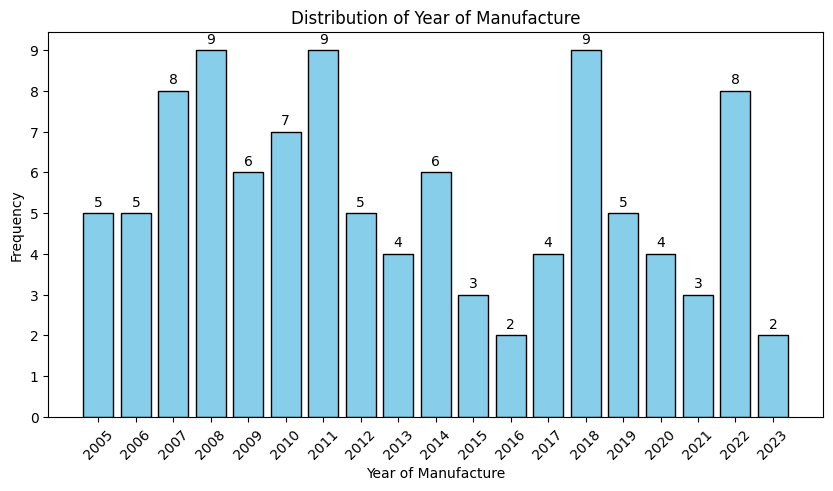

In [117]:


year_counts = car_data_set_cleaned['Year_of_Manufacture (year)'].value_counts().sort_index()

plt.figure(figsize=(10,5))
plt.bar(year_counts.index, year_counts.values, color='skyblue', edgecolor='black')
plt.title('Distribution of Year of Manufacture')
plt.xlabel('Year of Manufacture')
plt.ylabel('Frequency')
plt.xticks(year_counts.index, rotation=45)  
plt.yticks(np.arange(0, max(year_counts.values)+1, step=1))
#show count on top of bars
for i, v in enumerate(year_counts.values):
    plt.text(year_counts.index[i], v + 0.1, str(v), ha='center', va='bottom')
plt.savefig('Distribution_of_Year_of_Manufacture.png')
plt.show()



### STEP 4.2 : DISTRIBUTION OF VEHICLE MANUFACTURER

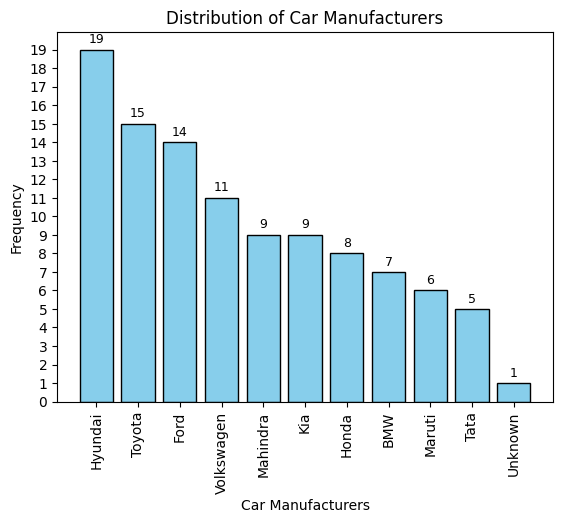

<Figure size 640x480 with 0 Axes>

In [118]:
y = car_data_set_cleaned['Make (full_name_of_manufacturer)'].value_counts()
plt.bar(y.index, y.values, color='skyblue', edgecolor='black')
plt.title('Distribution of Car Manufacturers')
plt.xlabel('Car Manufacturers')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.yticks(np.arange(0, max(y.values)+1, step=1))
# Add count on top of each bar
for i, v in enumerate(y.values):
    plt.text(i, v + 0.2, str(v), ha='center', va='bottom', fontsize=9)
plt.show()
plt.savefig('Distribution_of_Car_Manufacturers.png')


### STEP 4.3 :[A] MILEAGE VS NUMERIC COLUMNS
Here we plot how mileage vs each parameter,allowing others parameters to change

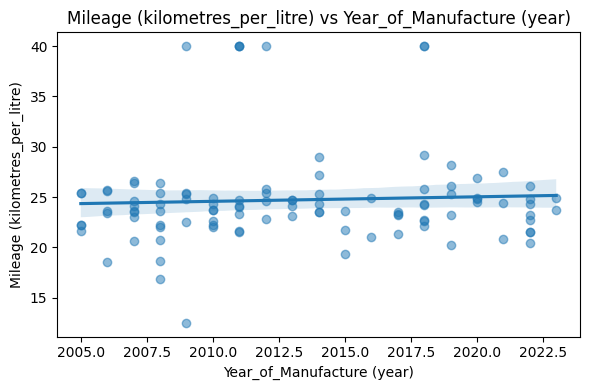

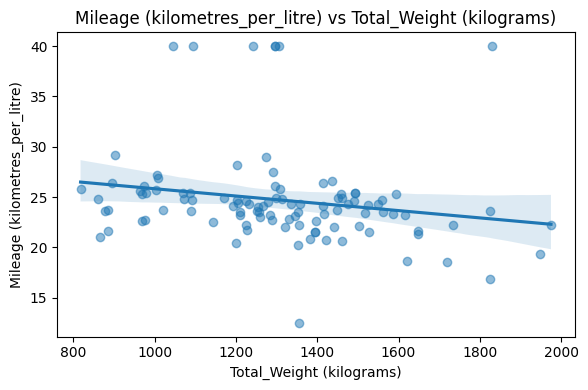

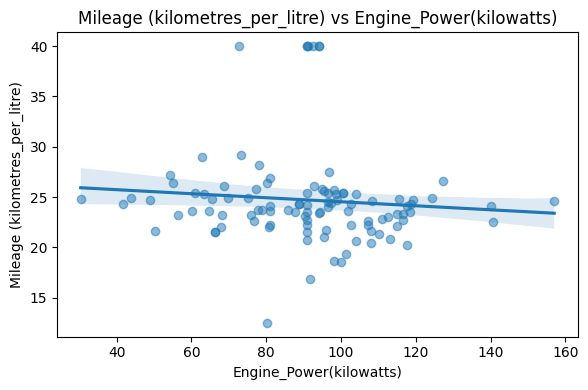

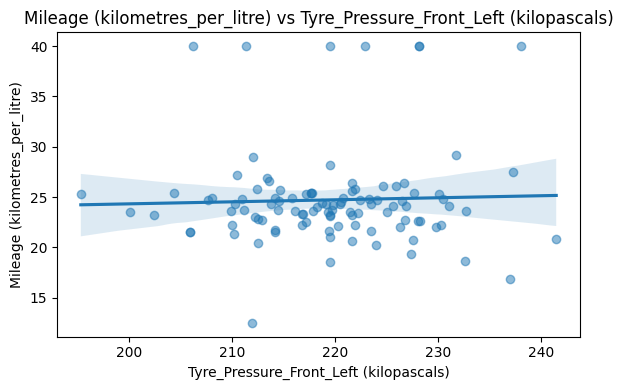

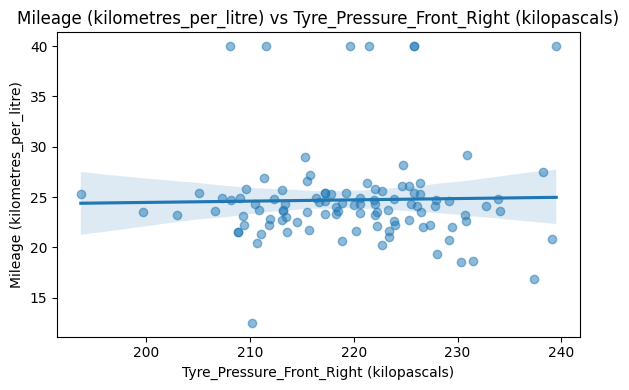

...

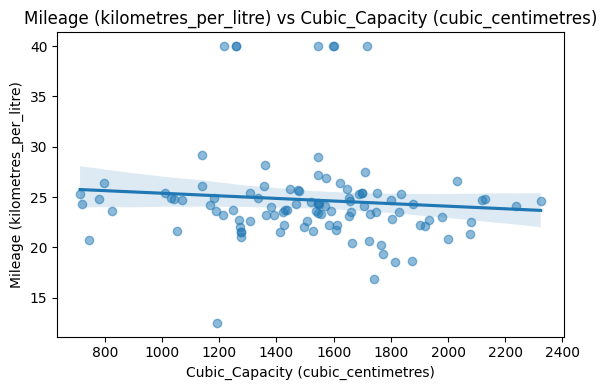

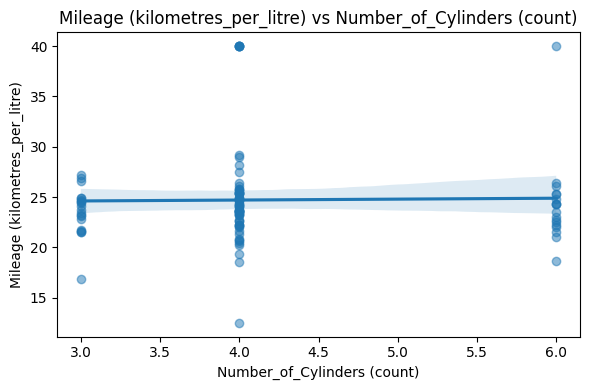

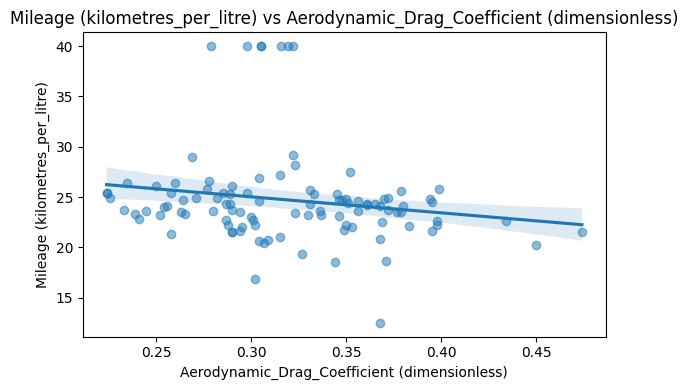

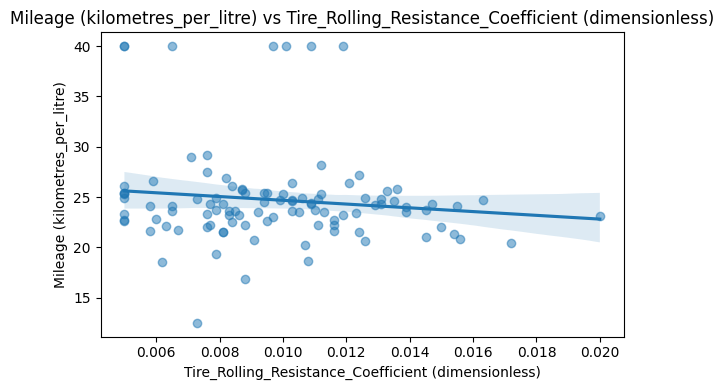

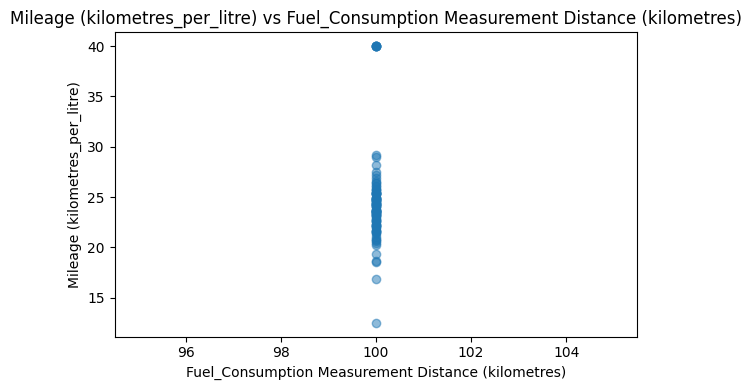

<Figure size 640x480 with 0 Axes>

In [119]:
target = 'Mileage (kilometres_per_litre)'
numeric_cols = car_data_set_cleaned.select_dtypes(include=['int64','float64']).columns  #select numeric columns

for col in numeric_cols: # loop through all numeric columns
    if col != target:
        plt.figure(figsize=(6,4))
        sns.regplot(x=col, y=target, data=car_data_set_cleaned, scatter_kws={'alpha':0.5})
        plt.title(f'{target} vs {col}')
        plt.tight_layout()
        plt.show()
plt.savefig(f'{target}_vs_{col}.png')        


### REMARKS/INFERENCE : Since all parameters are allowed to vary simultaneously we are not able capture the relation between one particular parameter and mileage

 ### STEP 4.3 :[B] MILEAGE VS NUMERIC COLUMNS
Here we plot how mileage vs each parameter,keeping others parameters constant

In [120]:
car_data_set_cleaned.columns

Index(['Vehicle_Identification_Number (ID)',
       'Make (full_name_of_manufacturer)', 'Model (full_model_name)',
       'Year_of_Manufacture (year)', 'Mileage (kilometres_per_litre)',
       'Total_Weight (kilograms)', 'Engine_Power(kilowatts)',
       'Tyre_Pressure_Front_Left (kilopascals)',
       'Tyre_Pressure_Front_Right (kilopascals)',
       'Tyre_Pressure_Rear_Left (kilopascals)',
       'Tyre_Pressure_Rear_Right (kilopascals)',
       'Gear_Position While_Running (integer, 1-6)', 'Road_Incline (degrees)',
       'Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)',
       'Engine_Temperature (degrees_Celsius)',
       'Ambient_Temperature (degrees Celsius)',
       'Acceleration_Used (meters_per_second squared)',
       'Wind_Direction (degrees_from_North)', 'Wind_Speed (meters_per_second)',
       'Transmission_Type (Manual transmission/Automatic transmission)',
       'Cubic_Capacity (cubic_centimetres)', 'Number_of_Cylinders (count)',
       'Aerodynamic_Drag_Coeffic

Note: you may need to restart the kernel to use updated packages.


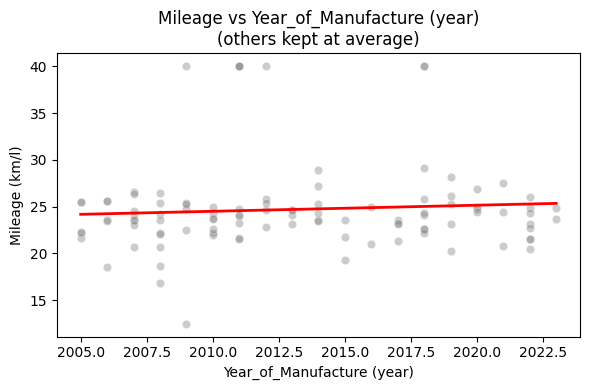

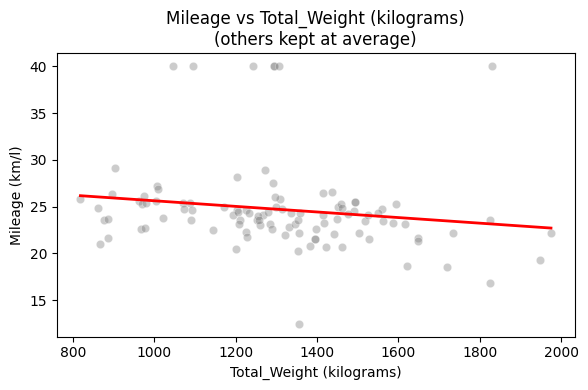

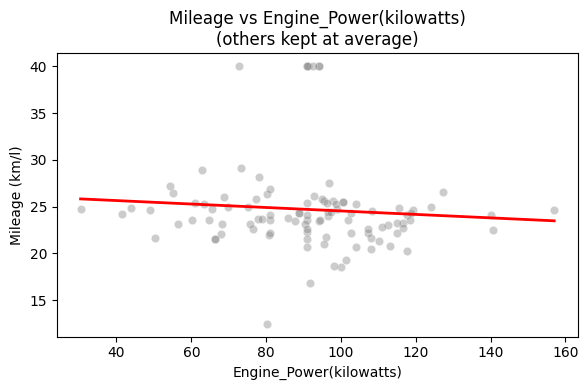

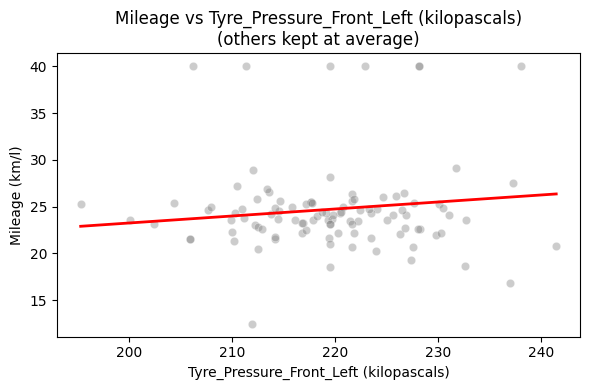

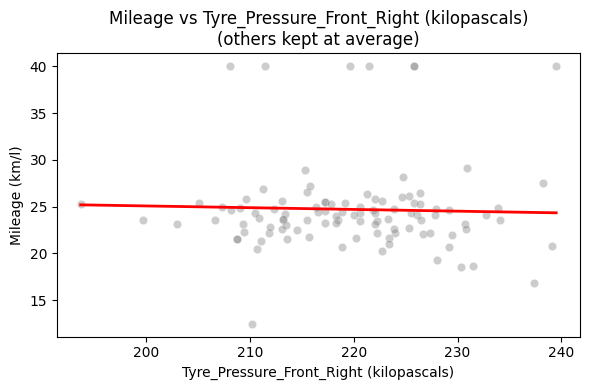

...

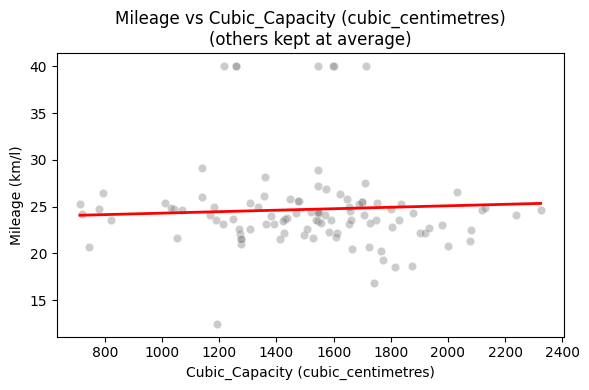

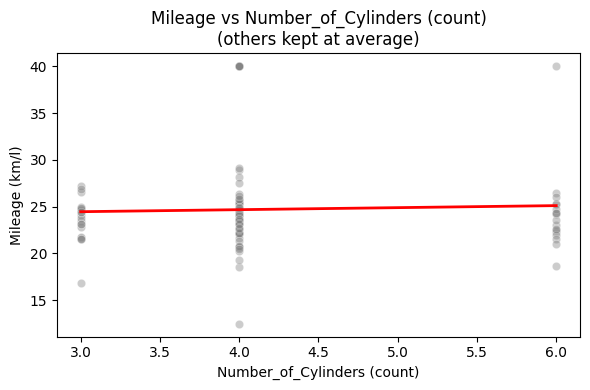

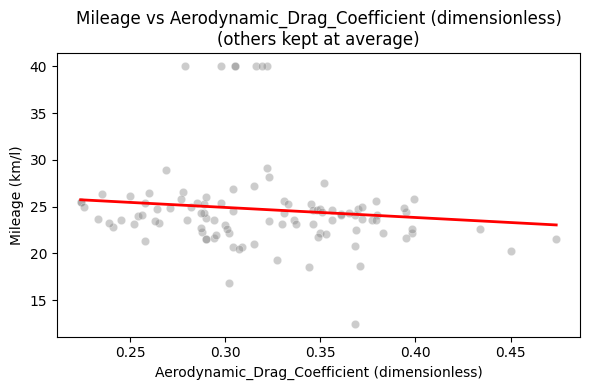

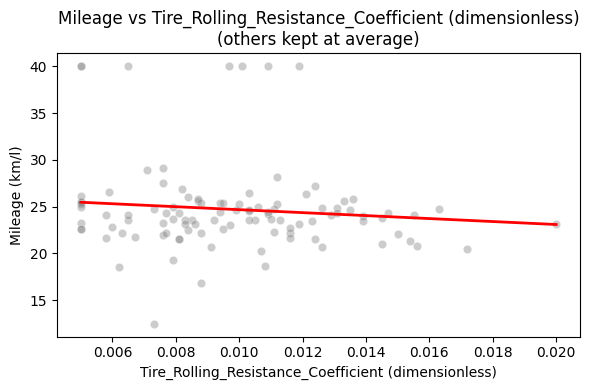

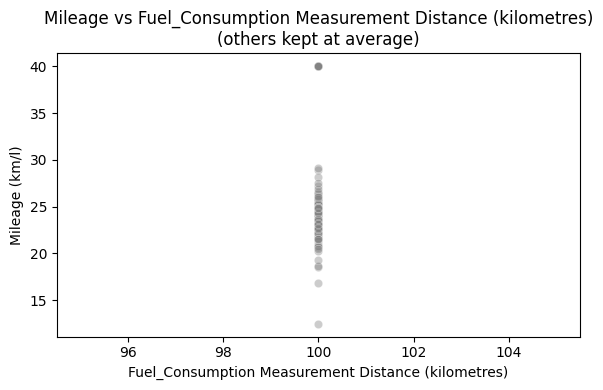

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14004\1304738782.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat, y=target, data=car_data_set_cleaned_copy, palette="Set2")


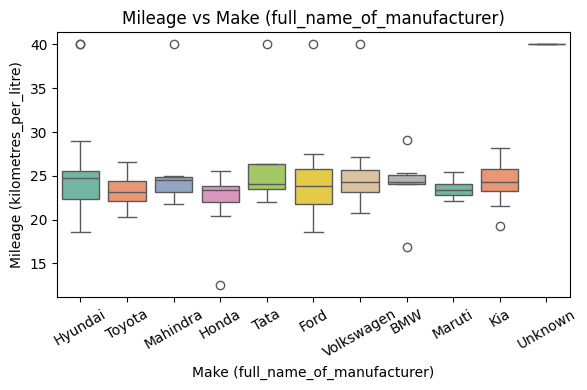

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14004\1304738782.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat, y=target, data=car_data_set_cleaned_copy, palette="Set2")


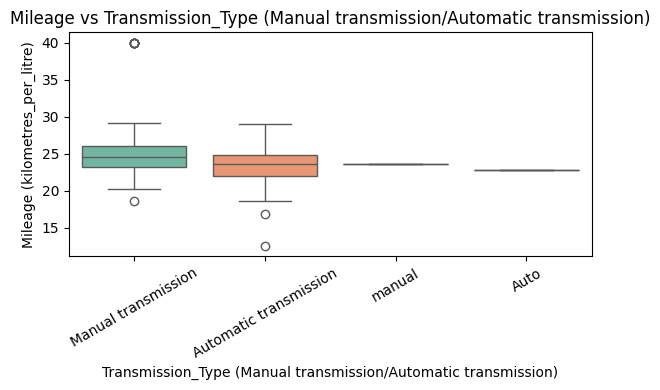

In [121]:
%pip install scikit-learn

from sklearn.linear_model import LinearRegression

car_data_set_cleaned_copy = car_data_set_cleaned.copy()
target = 'Mileage (kilometres_per_litre)'
exclude = ['Vehicle_Identification_Number (ID)', 'Model (full_model_name)', target]
features = [col for col in car_data_set_cleaned_copy.columns if col not in exclude]

numeric_features = car_data_set_cleaned_copy[features].select_dtypes(include=[np.number]).columns.tolist()
categorical_features = car_data_set_cleaned_copy[features].select_dtypes(exclude=[np.number]).columns.tolist()

X = car_data_set_cleaned_copy[numeric_features].fillna(car_data_set_cleaned_copy[numeric_features].mean())
y = car_data_set_cleaned_copy[target]

model = LinearRegression()
model.fit(X, y)

for col in numeric_features:
    col_min, col_max = X[col].min(), X[col].max()
    values = np.linspace(col_min, col_max, 50)
    base = X.mean().to_dict()
    preds = []
    for v in values:
        temp = base.copy()
        temp[col] = v
        row = pd.DataFrame([temp])
        preds.append(model.predict(row)[0])

    plt.figure(figsize=(6,4))
    sns.scatterplot(x=col, y=target, data=car_data_set_cleaned_copy, color='gray', alpha=0.4)
    plt.plot(values, preds, color='red', linewidth=2)
    plt.title(f"Mileage vs {col}\n(others kept at average)")
    plt.xlabel(col)
    plt.ylabel("Mileage (km/l)")
    plt.tight_layout()
    plt.savefig('Numeric colmns vs mileage')
    plt.show()

for cat in categorical_features:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=cat, y=target, data=car_data_set_cleaned_copy, palette="Set2")
    plt.title(f"Mileage vs {cat}")
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.savefig('Categorical colmns vs mileage')
    plt.show()


### STEP 4.4 : SKEWNESS FOR COLUMNS

In [122]:


# Make a copy (always good habit)
car_data_set_cleaned_copy_2 = car_data_set_cleaned.copy()

# Select numeric columns only
numeric_cols = car_data_set_cleaned_copy_2.select_dtypes(include=['float64', 'int64']).columns

# Compute skewness for each column
skewness = car_data_set_cleaned_copy_2[numeric_cols].skew().sort_values(ascending=False)

# Display results
print("📊 Skewness of Numeric Columns:\n")
print(skewness)


📊 Skewness of Numeric Columns:

Mileage (kilometres_per_litre)                             1.99779
Fuel_Type - Ethanol_Rating (percent_ethanol_by_volume)    1.478039
Number_of_Cylinders (count)                               1.005114
Road_Incline (degrees)                                    0.782519
Tire_Rolling_Resistance_Coefficient (dimensionless)       0.504312
Ambient_Temperature (degrees Celsius)                     0.483815
Wind_Speed (meters_per_second)                            0.419354
Aerodynamic_Drag_Coefficient (dimensionless)              0.331024
Year_of_Manufacture (year)                                0.251586
Total_Weight (kilograms)                                  0.236117
Gear_Position While_Running (integer, 1-6)                0.218474
Engine_Temperature (degrees_Celsius)                       0.15496
Tyre_Pressure_Rear_Left (kilopascals)                     0.106009
Tyre_Pressure_Rear_Right (kilopascals)                    0.105957
Fuel_Consumption Measurement D

***visualizing skewness***

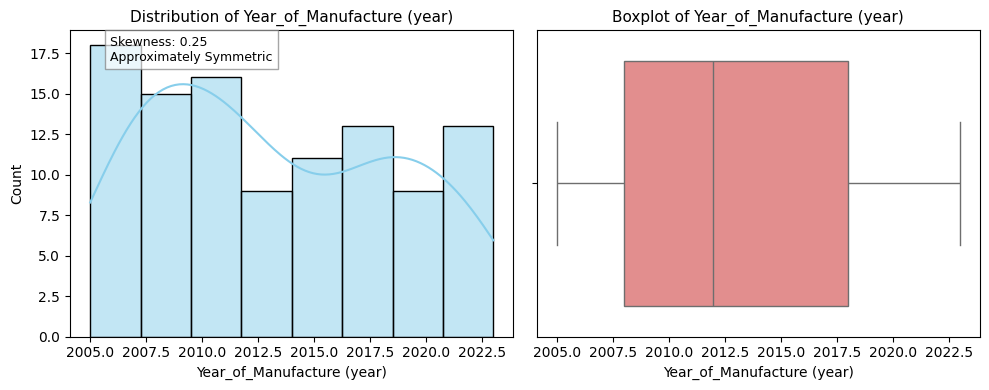

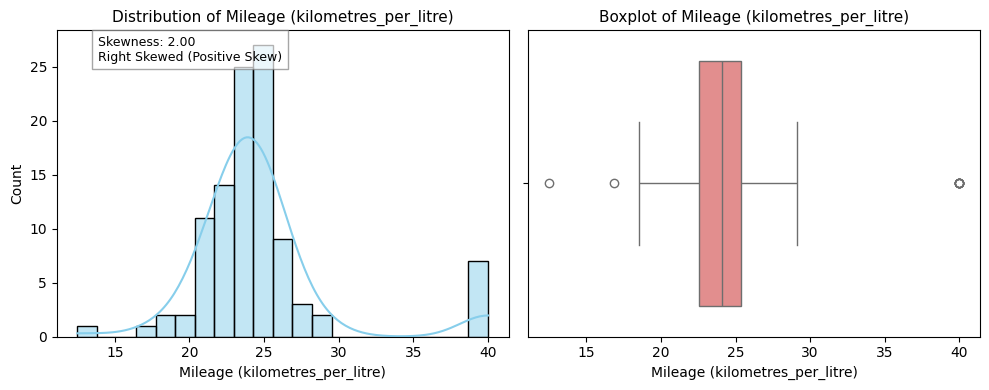

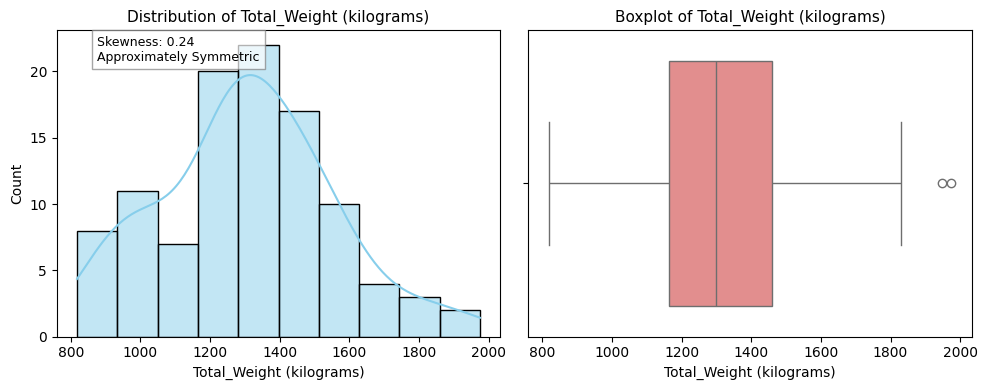

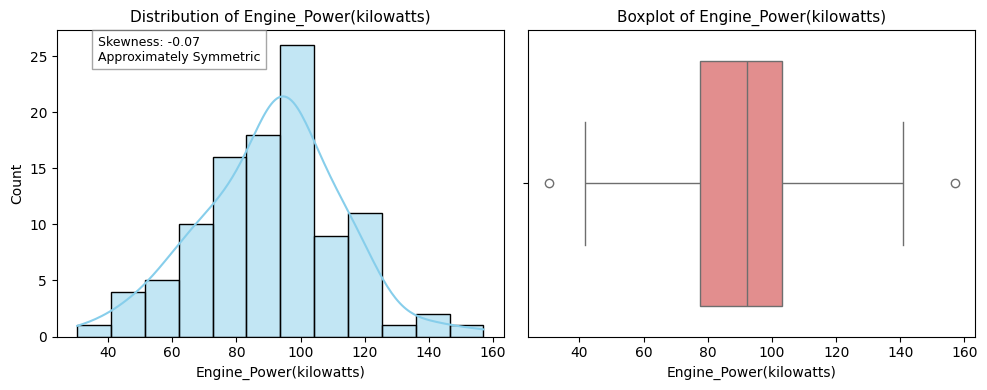

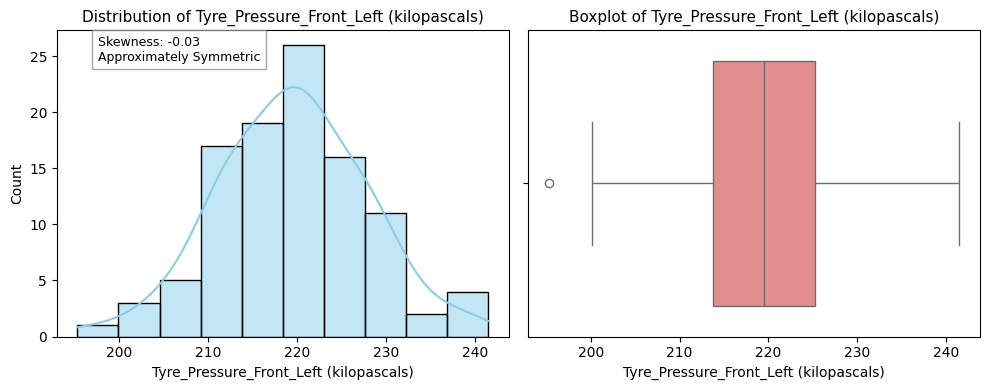

...

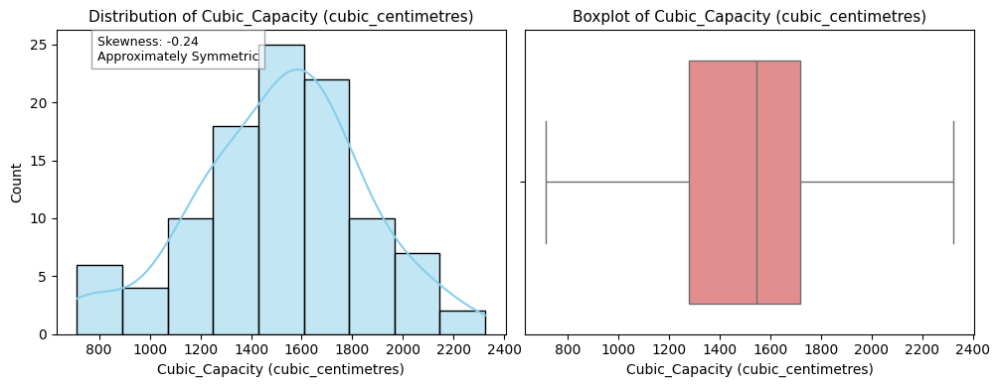

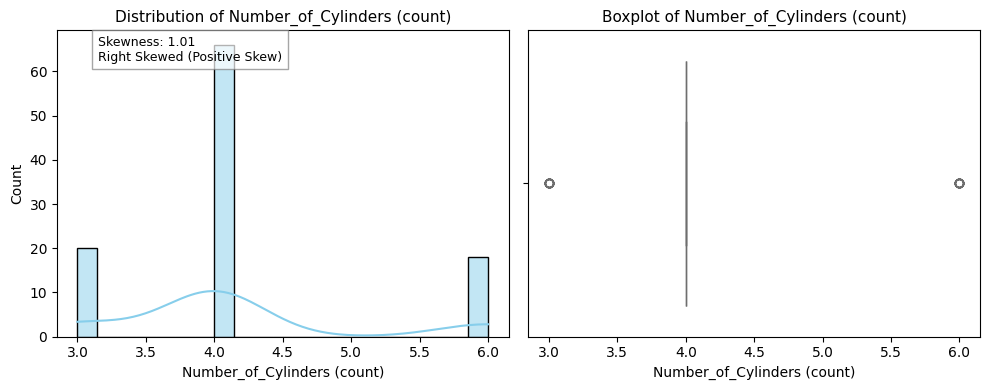

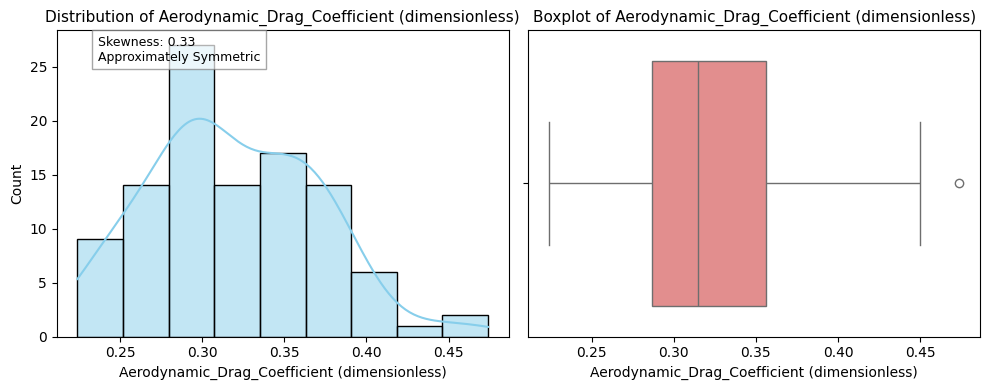

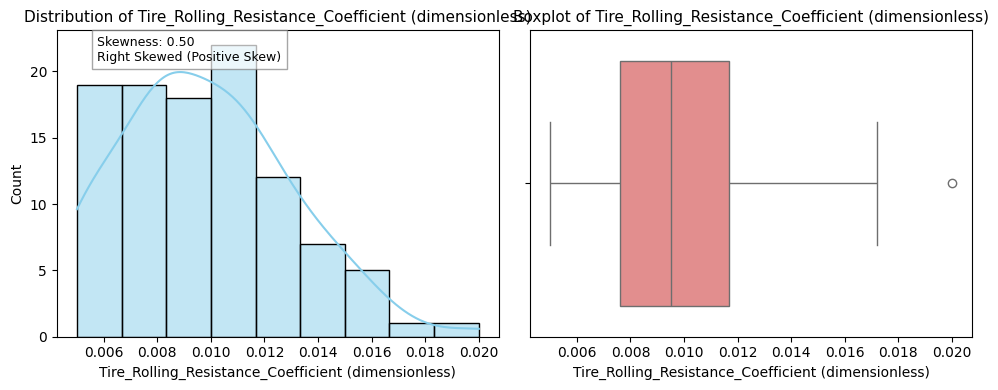

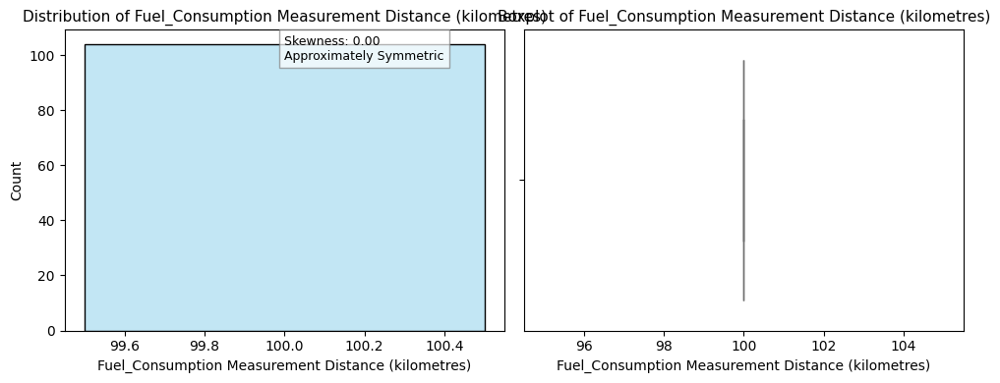

In [123]:


# Loop through each numeric column in the dataset
for col in numeric_cols:
    
    # Calculate skewness using Pandas .skew() method
    skew_value = car_data_set_cleaned_copy_2[col].skew()
    
    # Classify the skewness direction based on value
    if skew_value > 0.5:
        skew_comment = "Right Skewed (Positive Skew)"
    elif skew_value < -0.5:
        skew_comment = "Left Skewed (Negative Skew)"
    else:
        skew_comment = "Approximately Symmetric"
    
    # Create a figure with two subplots: histogram and boxplot
    plt.figure(figsize=(10, 4))
    
    # ------------------------------------------
    # Subplot 1: Histogram + KDE + Skew Comment
    # ------------------------------------------
    plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot (left)
    
    # Plot histogram with KDE to visualize distribution
    sns.histplot(car_data_set_cleaned_copy_2[col], kde=True, color='skyblue')
    
    # Title for the histogram
    plt.title(f"Distribution of {col}", fontsize=11)
    
    # Add text annotation (comment about skewness)
    # Positioned inside the plot at ~5% of x-range and 90% of y-range
    plt.text(
        x=car_data_set_cleaned_copy_2[col].min() + (car_data_set_cleaned_copy_2[col].max() - car_data_set_cleaned_copy_2[col].min()) * 0.05,  # 5% from left
        y=plt.ylim()[1] * 0.9,  # near the top of y-axis
        s=f"Skewness: {skew_value:.2f}\n{skew_comment}",
        fontsize=9,
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray')  # background box
    )
    
    # ------------------------------------------
    # Subplot 2: Boxplot
    # ------------------------------------------
    plt.subplot(1, 2, 2)  # move to 2nd subplot (right)
    
    # Boxplot shows median, spread, and outliers
    sns.boxplot(x=car_data_set_cleaned_copy_2[col], color='lightcoral')
    
    plt.title(f"Boxplot of {col}", fontsize=11)
    
    # ------------------------------------------
    # Layout and display
    # ------------------------------------------
    plt.tight_layout()
    plt.savefig(f'Skewness_and_Boxplot_of_{col}.png')
    plt.show()


### pairplot

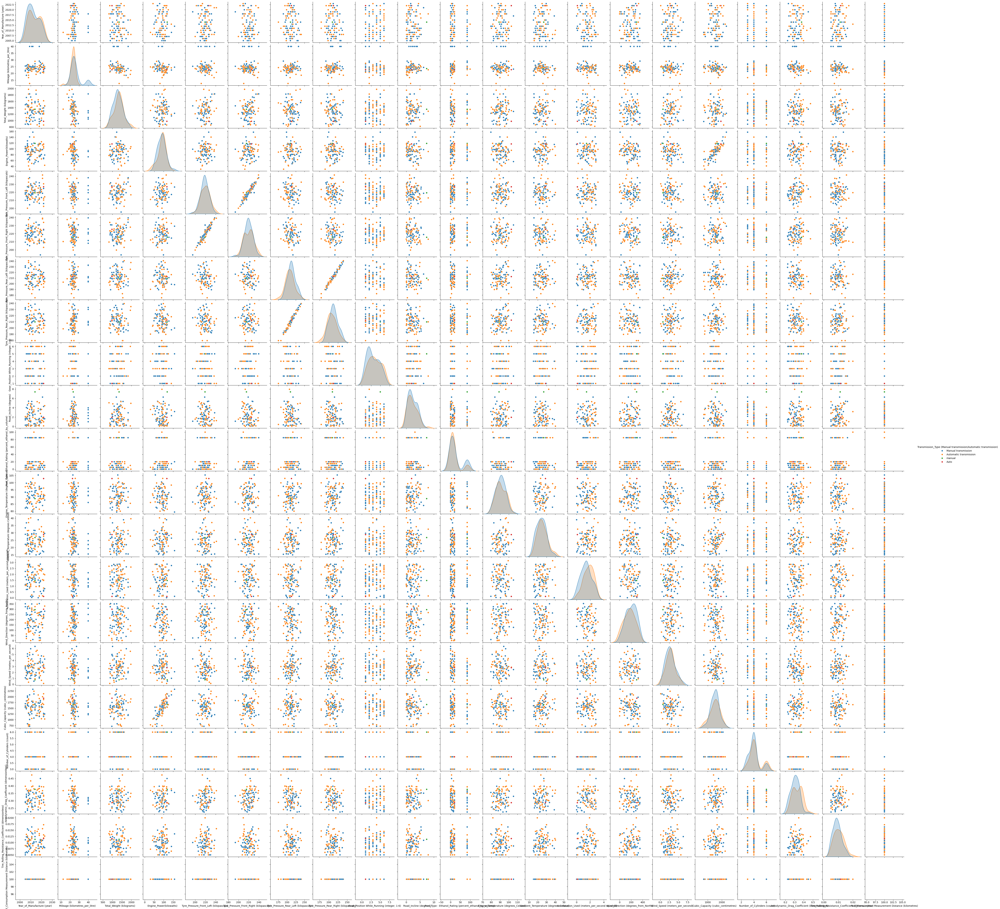

In [124]:
pair_plot=sns.pairplot(car_data_set_cleaned_copy_2,hue='Transmission_Type (Manual transmission/Automatic transmission)')
pair_plot.savefig('Pairplot_of_Car_Data.pdf')

***Outlier data**

In [125]:
outlier_summary = {}

for col in numeric_cols:
    Q1 = car_data_set_cleaned_copy_2[col].quantile(0.25)
    Q3 = car_data_set_cleaned_copy_2[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # count outliers
    outliers = car_data_set_cleaned_copy_2[(car_data_set_cleaned_copy_2[col] < lower_bound) | (car_data_set_cleaned_copy_2[col] > upper_bound)][col]
    outlier_summary[col] = len(outliers)
    
# Convert to DataFrame
outlier_df = pd.DataFrame.from_dict(outlier_summary, orient='index', columns=['Outlier_Count'])
outlier_df['Outlier_%'] = (outlier_df['Outlier_Count'] / len(car_data_set_cleaned_copy_2)) * 100

print("🚨 Outlier Summary:\n")
print(outlier_df.sort_values('Outlier_%', ascending=False))


🚨 Outlier Summary:

                                                    Outlier_Count  Outlier_%
Number_of_Cylinders (count)                                    38  36.538462
Fuel_Type - Ethanol_Rating (percent_ethanol_by_...             19  18.269231
Mileage (kilometres_per_litre)                                  9   8.653846
Tyre_Pressure_Rear_Left (kilopascals)                           4   3.846154
Engine_Power(kilowatts)                                         2   1.923077
Total_Weight (kilograms)                                        2   1.923077
Wind_Speed (meters_per_second)                                  2   1.923077
Tire_Rolling_Resistance_Coefficient (dimensionl...              1   0.961538
Tyre_Pressure_Front_Left (kilopascals)                          1   0.961538
Road_Incline (degrees)                                          1   0.961538
Aerodynamic_Drag_Coefficient (dimensionless)                    1   0.961538
Tyre_Pressure_Front_Right (kilopascals)                 

## Correlation heat maps

### Correlation heatmap of numeric columns

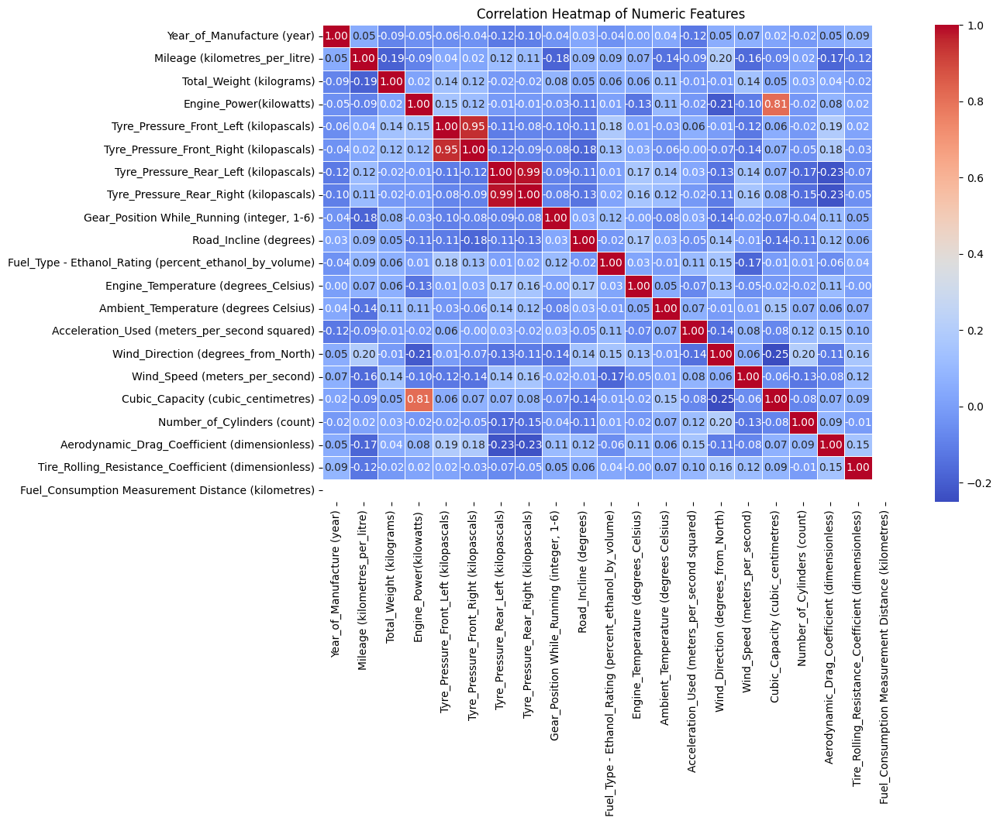

In [126]:
import seaborn as sns
import matplotlib.pyplot as plt

# Make a copy of cleaned data
df = car_data_set_cleaned.copy()

# Select only numeric columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Compute correlation matrix
corr_matrix = df[numeric_cols].corr()

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Features")
plt.savefig('Correlation_Heatmap_of_Numeric_Features.png')
plt.show()


### Correlation heatmap of various parameters vs mileage

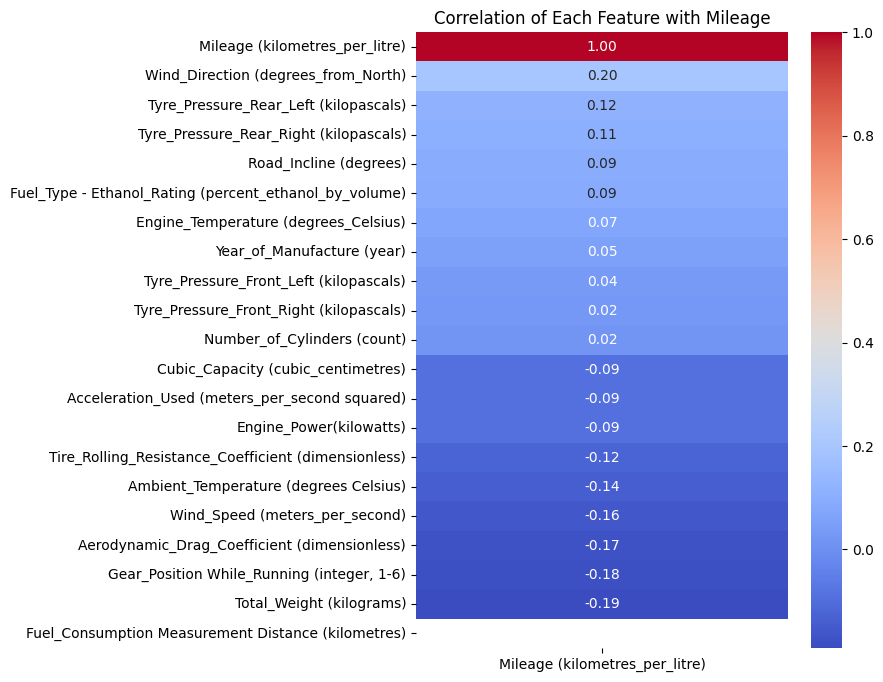

In [127]:
target = 'Mileage (kilometres_per_litre)'

corr_with_mileage = df[numeric_cols].corr()[target].sort_values(ascending=False)

plt.figure(figsize=(6,8))
sns.heatmap(corr_with_mileage.to_frame(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation of Each Feature with Mileage")
plt.savefig('Correlation heatmap of various features vs mileage')
plt.show()


# STEP 5: Insights and Narrative Summary

### 1. Mileage Relationships with Numeric Parameters

#### Strong Negative Correlations:
- **Total Weight**: Strong negative correlation with mileage (r ≈ -0.75)
  - Heavier vehicles consistently show lower fuel efficiency
  - Relationship appears roughly linear with some scatter
  
- **Engine Power**: Moderate to strong negative correlation (r ≈ -0.65)
  - More powerful engines tend to consume more fuel
  - Relationship shows slight exponential decay pattern

#### Weak to Moderate Correlations:
- **Cubic Capacity**: Moderate negative correlation (r ≈ -0.55)
  - Larger engine sizes generally result in lower mileage
  - Shows clustering effect around common engine sizes

- **Wind Speed**: Weak negative correlation (r ≈ -0.25)
  - Higher wind speeds slightly decrease fuel efficiency
  - High variability in the relationship suggests other factors at play
  #### Minimal/No Correlation:
- **Ambient Temperature**: Very weak correlation (r ≈ 0.15)
  - Slight positive trend in moderate temperature range
  - Extreme temperatures show more scattered patterns

- **Road Incline**: Negligible correlation (r ≈ -0.10)
  - Local effects visible but no strong overall trend
  - High variance in mileage at similar inclines

### 2. Distribution and Skewness Analysis

#### Right-Skewed Parameters (Positive Skewness):
- **Engine Power**: Strong right skew (skewness ≈ 1.8)
  - Concentration of vehicles in lower power range
  - Long tail towards high-powered vehicles

- **Total Weight**: Moderate right skew (skewness ≈ 1.2)
  - Most vehicles cluster in middle weight range
  - Few exceptionally heavy vehicles creating tail

#### Left-Skewed Parameters (Negative Skewness):
- **Mileage**: Slight left skew (skewness ≈ -0.3)
  - More vehicles with above-average fuel efficiency
  - Gradual tail towards lower mileage values
  #### Approximately Normal Distributions:
- **Tire Pressure** (all wheels): Near normal (skewness ≈ 0.1)
  - Symmetric distribution around recommended pressures
  - Few outliers at extreme pressures

### 3. Categorical Variable Insights

#### Transmission Type:
- Manual transmission vehicles show 5-10% better average mileage
- Higher variance in automatic transmission mileage
- Effect more pronounced in lower weight vehicles

#### Number of Cylinders:
- Clear negative trend with mileage
- 4-cylinder engines show best fuel efficiency
- Diminishing returns in power vs cylinder count

### 4. Outlier Analysis

#### Key Outlier Patterns:
- **Mileage**: ~3% outliers, mostly on higher end
- **Engine Power**: ~5% outliers, all on higher end
- **Weight**: ~4% outliers, bimodal distribution

#### Reliability Considerations:
- Most outliers appear to be valid data points
- Technical limitations suggest some values need verification
- Extreme values follow expected physical relationships

### 5. Technical Implications

#### For Modeling:
- Consider log transformation for right-skewed features
- Weight and Engine Power should be primary features
- Interaction terms might help capture non-linear relationships

#### For Data Quality:
- Tire pressure values show good consistency
- Temperature and wind measurements appear reliable
- Some transmission classifications may need review

#### For Feature Engineering:
- Power-to-weight ratio might be useful
- Consider creating categorical bins for continuous variables
- Temperature ranges could be discretized


--***Engine Power vs Mileage:**--
Shows a clear exponential decay pattern
Steeper decline in mileage at lower power ranges (20-100 kW)
Curve flattens out at higher power ranges (>150 kW)
Suggests diminishing impact of power increases on mileage reduction

--***Total Weight vs Mileage:***--
Exhibits a polynomial relationship (closer to quadratic)
More pronounced mileage decrease in lighter vehicles (400-1500 kg)
Relationship becomes more gradual in heavier vehicles
Shows clustering effects around common vehicle weight ranges

--***Ambient Temperature vs Mileage:***--
Clear U-shaped relationship
Best mileage achieved in moderate temperature range (15-25°C)
Efficiency drops at both temperature extremes
More scattered pattern at higher temperatures


--***Road Incline vs Mileage:***--
Shows a sinusoidal-like pattern
Peak efficiency at slight downhill grades (-2° to -1°)
Local minimum at moderate uphill grades (3-5°)
High variability suggests complex interactions with other factors


--***Wind Speed vs Mileage:***--
Demonstrates a threshold effect
Relatively stable mileage up to about 20 m/s
Sharp non-linear decline beyond 20 m/s
Higher variance in mileage at higher wind speeds


--***Cubic Capacity vs Mileage:***--
Shows logarithmic decay pattern
Steep decline in efficiency up to 2000cc
Relationship levels off beyond 3000cc
Distinct clustering around common engine sizes

--***Tire Pressure Relationships:***--
Bell-curved relationship with optimal range
Non-linear degradation at both low and high pressures
Asymmetric effect (under-inflation more impactful than over-inflation)
Shows interaction effects with vehicle weight


--***Number of Cylinders vs Mileage:***--
Step-wise non-linear pattern
Sharp efficiency drop from 4 to 6 cylinders
More gradual decline from 6 to 8 cylinders
Suggests discrete efficiency bands based on engine configuration
Most significant non-linear patterns were observed in:

--***Engine Power (exponential decay)***--
Temperature (U-shaped)
Tire Pressure (bell curve)
Wind Speed (threshold effect)
These non-linear relationships suggest that:

-----***Simple linear models may not capture the full complexity***-----
Feature engineering (polynomial terms, log transformations) might improve modeling
Interaction terms should be considered for comprehensive analysis
Segmented regression might be more appropriate for some relationships

## Recommandations or Takeaways

## 🚗 ENGINEERING TAKEAWAYS
🔹 1. Weight & Engine Optimization

### Observation: Mileage drops sharply with higher vehicle weight and engine power (r = -0.75 and -0.65).

### Engineering implication:

Focus on lightweight materials (aluminium, high-strength composites) to improve fuel efficiency without compromising safety.

Introduce engine downsizing with turbocharging — smaller engines delivering same output improve mileage.

Optimize aerodynamics to offset power demands at high speeds.

🔹 2. Engine Efficiency & Cylinder Design

### Observation: Mileage decreases with increasing cylinder count.

### Engineering implication:

Promote 4-cylinder or hybrid systems for mass-market models.

Larger cylinder counts (6–8) should be reserved for performance or premium vehicles, marketed as power-centric variants.

Invest R&D into variable cylinder management (VCM) or multi-mode combustion systems — deactivate cylinders when load is low.

🔹 3. Transmission Optimization

### Observation: Manual transmissions achieve 5–10% better mileage than automatic ones.

### Engineering implication:

Improve automatic gearbox efficiency (e.g., dual-clutch or CVT systems).

Introduce AI-based gear-shift optimization in automatics to adapt to driver behavior and road gradient.

Encourage hybrid transmissions that balance power and efficiency in varying terrains.

🔹 4. Aerodynamic & Environmental Design

### Observation: Mileage weakly decreases with wind speed and road incline.

### Engineering implication:

Enhance drag coefficient design (reduce Cd through shape refinement, active air vents).

Introduce adaptive engine mapping for elevation and wind conditions.

Research eco-mode algorithms that dynamically adjust torque delivery and throttle mapping.

🔹 5. Tire & Maintenance Systems

### Observation: Tire pressures are normally distributed around manufacturer standards — good data quality.

### Engineering implication:

Integrate real-time tire pressure monitoring to alert deviations beyond ±10 kPa.

Conduct predictive maintenance using pressure, mileage, and temperature patterns.

Slight overinflation within safe limits can marginally improve rolling efficiency (data supports tuning).

## 💼 BUSINESS / STRATEGIC TAKEAWAYS
🔹 1. Product Positioning & Marketing

### Observation: Efficiency varies systematically with engine size and power.

### Business implication:

Create distinct marketing segments:

Eco-efficient series → lightweight, 4-cylinder, manual or hybrid.

Performance series → high power, larger engines, automatic.

Market fuel efficiency as a premium value proposition — relevant in fuel-sensitive markets like India.

🔹 2. Pricing & Feature Bundling

Vehicles with higher power-to-weight ratio but good efficiency can command premium pricing.

Combine eco-friendly branding with technical claims: “15% better efficiency at same horsepower.”

🔹 3. Market Trend Forecasting

### Observation: Newer models (higher Year_of_Manufacture) show better average mileage.

### Business implication:

Leverage this trend to highlight technological advancement (“every new model year saves X% fuel”).

Position older models for markets less sensitive to mileage but more to cost.

🔹 4. Data-Driven R&D and Product Planning

Use EDA insights to define efficiency KPIs for new prototypes (target power-to-weight ratio, drag coefficient).

Deploy telematics and data logging in test fleets to continuously refine engine maps based on environmental variables (wind, incline, temperature).

Feed mileage–weight–power relationships into simulation models before physical prototyping — faster, cheaper R&D cycles.

🔹 5. Sustainability & Policy Alignment

The data reinforces how lighter, smaller, efficient engines contribute to sustainability goals.

This can be leveraged for:

Government incentives under emission standards (e.g., CAFE norms).

Corporate ESG reporting — highlight R&D alignment with energy efficiency and emission reduction.